<a href="https://colab.research.google.com/github/Manaswini-Anand/Analysis-on-Credit-risk-using-M-L/blob/main/final_Copy_of_credit_risk.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# PROJECT PPT
CANVA LINK : https://www.canva.com/design/DAGwbyyHsFQ/Fd_9_Xlyi-u_4jIX7ZSyiA/edit?utm_content=DAGwbyyHsFQ&utm_campaign=designshare&utm_medium=link2&utm_source=sharebutton

#  libraries

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.utils import compute_class_weight
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.model_selection import cross_val_score


#preprocessing

In [ ]:
data=pd.read_excel('/content/credit card_dataset.xlsx')
data

,Gender,Age,Debt,Married,BankCustomer,Industry,Ethnicity,YearsEmployed,PriorDefault,Employed,CreditScore,DriversLicense,Citizen,ZipCode,Income,Approved
0,1,30.83,0.000,1,1,Industrials,White,1.25,1,1,1,0,ByBirth,202,0,1
1,0,58.67,4.460,1,1,Materials,Black,3.04,1,1,6,0,ByBirth,43,560,1
2,0,24.50,0.500,1,1,Materials,Black,1.50,1,0,0,0,ByBirth,280,824,1
3,1,27.83,1.540,1,1,Industrials,White,3.75,1,1,5,1,ByBirth,100,3,1
4,1,20.17,5.625,1,1,Industrials,White,1.71,1,0,0,0,ByOtherMeans,120,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
685,1,21.08,10.085,0,0,Education,Black,1.25,0,0,0,0,ByBirth,260,0,0
686,0,22.67,0.750,1,1,Energy,White,2.00,0,1,2,1,ByBirth,200,394,0
687,0,25.25,13.500,0,0,Healthcare,Latino,2.00,0,1,1,1,ByBirth,200,1,0
688,1,17.92,0.205,1,1,ConsumerStaples,White,0.04,0,0,0,0,ByBirth,280,750,0


In [ ]:
data.isnull().sum()

,0
Gender,0
Age,0
Debt,0
Married,0
BankCustomer,0
Industry,0
Ethnicity,0
YearsEmployed,0
PriorDefault,0
Employed,0


In [ ]:
data.shape

(690, 16)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 690 entries, 0 to 689
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Gender          690 non-null    int64  
 1   Age             690 non-null    float64
 2   Debt            690 non-null    float64
 3   Married         690 non-null    int64  
 4   BankCustomer    690 non-null    int64  
 5   Industry        690 non-null    object 
 6   Ethnicity       690 non-null    object 
 7   YearsEmployed   690 non-null    float64
 8   PriorDefault    690 non-null    int64  
 9   Employed        690 non-null    int64  
 10  CreditScore     690 non-null    int64  
 11  DriversLicense  690 non-null    int64  
 12  Citizen         690 non-null    object 
 13  ZipCode         690 non-null    int64  
 14  Income          690 non-null    int64  
 15  Approved        690 non-null    int64  
dtypes: float64(3), int64(10), object(3)
memory usage: 86.4+ KB


In [ ]:
#identifying garbage values
for i in data.select_dtypes(include="object").columns:
  print(i)
  print(data[i].value_counts())
  print("***"*10)

Industry
Industry
Energy                   146
Materials                 78
Industrials               64
ConsumerDiscretionary     59
ConsumerStaples           54
Healthcare                53
Financials                51
InformationTechnology     41
Utilities                 38
CommunicationServices     38
Real Estate               30
Education                 25
Research                  10
Transport                  3
Name: count, dtype: int64
******************************
Ethnicity
Ethnicity
White     408
Black     138
Asian      59
Latino     57
Other      28
Name: count, dtype: int64
******************************
Citizen
Citizen
ByBirth         625
ByOtherMeans     57
Temporary         8
Name: count, dtype: int64
******************************


In [ ]:
data = pd.get_dummies(data, columns=['Industry', 'Ethnicity', 'Citizen'], drop_first=True)


In [ ]:
data.shape

(690, 32)

In [ ]:
bool_cols = data.select_dtypes(include='bool').columns
data[bool_cols] = data[bool_cols].astype(int)


In [ ]:
data['Gender'].unique()

array([1, 0])

In [ ]:
data['Industry_Real Estate'].unique()

array([0, 1])

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 690 entries, 0 to 689
Data columns (total 32 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender                          690 non-null    int64  
 1   Age                             690 non-null    float64
 2   Debt                            690 non-null    float64
 3   Married                         690 non-null    int64  
 4   BankCustomer                    690 non-null    int64  
 5   YearsEmployed                   690 non-null    float64
 6   PriorDefault                    690 non-null    int64  
 7   Employed                        690 non-null    int64  
 8   CreditScore                     690 non-null    int64  
 9   DriversLicense                  690 non-null    int64  
 10  ZipCode                         690 non-null    int64  
 11  Income                          690 non-null    int64  
 12  Approved                        690 

In [ ]:
data.head()

,Gender,Age,Debt,Married,BankCustomer,YearsEmployed,PriorDefault,Employed,CreditScore,DriversLicense,...,Industry_Real Estate,Industry_Research,Industry_Transport,Industry_Utilities,Ethnicity_Black,Ethnicity_Latino,Ethnicity_Other,Ethnicity_White,Citizen_ByOtherMeans,Citizen_Temporary
0,1,30.83,0.000,1,1,1.25,1,1,1,0,...,0,0,0,0,0,0,0,1,0,0
1,0,58.67,4.460,1,1,3.04,1,1,6,0,...,0,0,0,0,1,0,0,0,0,0
2,0,24.50,0.500,1,1,1.50,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,1,27.83,1.540,1,1,3.75,1,1,5,1,...,0,0,0,0,0,0,0,1,0,0
4,1,20.17,5.625,1,1,1.71,1,0,0,0,...,0,0,0,0,0,0,0,1,1,0


In [ ]:
data.duplicated().sum()

np.int64(0)

In [ ]:
data.isnull().sum()

,0
Gender,0
Age,0
Debt,0
Married,0
BankCustomer,0
YearsEmployed,0
PriorDefault,0
Employed,0
CreditScore,0
DriversLicense,0


In [ ]:
data.describe()

,Gender,Age,Debt,Married,BankCustomer,YearsEmployed,PriorDefault,Employed,CreditScore,DriversLicense,...,Industry_Real Estate,Industry_Research,Industry_Transport,Industry_Utilities,Ethnicity_Black,Ethnicity_Latino,Ethnicity_Other,Ethnicity_White,Citizen_ByOtherMeans,Citizen_Temporary
count,690.000000,690.000000,690.000000,690.000000,690.000000,690.000000,690.000000,690.000000,690.00000,690.000000,...,690.000000,690.000000,690.000000,690.000000,690.00000,690.000000,690.000000,690.000000,690.000000,690.000000
mean,0.695652,31.514116,4.758725,0.760870,0.763768,2.223406,0.523188,0.427536,2.40000,0.457971,...,0.043478,0.014493,0.004348,0.055072,0.20000,0.082609,0.040580,0.591304,0.082609,0.011594
std,0.460464,11.860245,4.978163,0.426862,0.425074,3.346513,0.499824,0.495080,4.86294,0.498592,...,0.204079,0.119597,0.065842,0.228287,0.40029,0.275490,0.197458,0.491949,0.275490,0.107128
min,0.000000,13.750000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,22.670000,1.000000,1.000000,1.000000,0.165000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,28.460000,2.750000,1.000000,1.000000,1.000000,1.000000,0.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,1.000000,0.000000,0.000000
75%,1.000000,37.707500,7.207500,1.000000,1.000000,2.625000,1.000000,1.000000,3.00000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,1.000000,0.000000,0.000000
max,1.000000,80.250000,28.000000,1.000000,1.000000,28.500000,1.000000,1.000000,67.00000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000


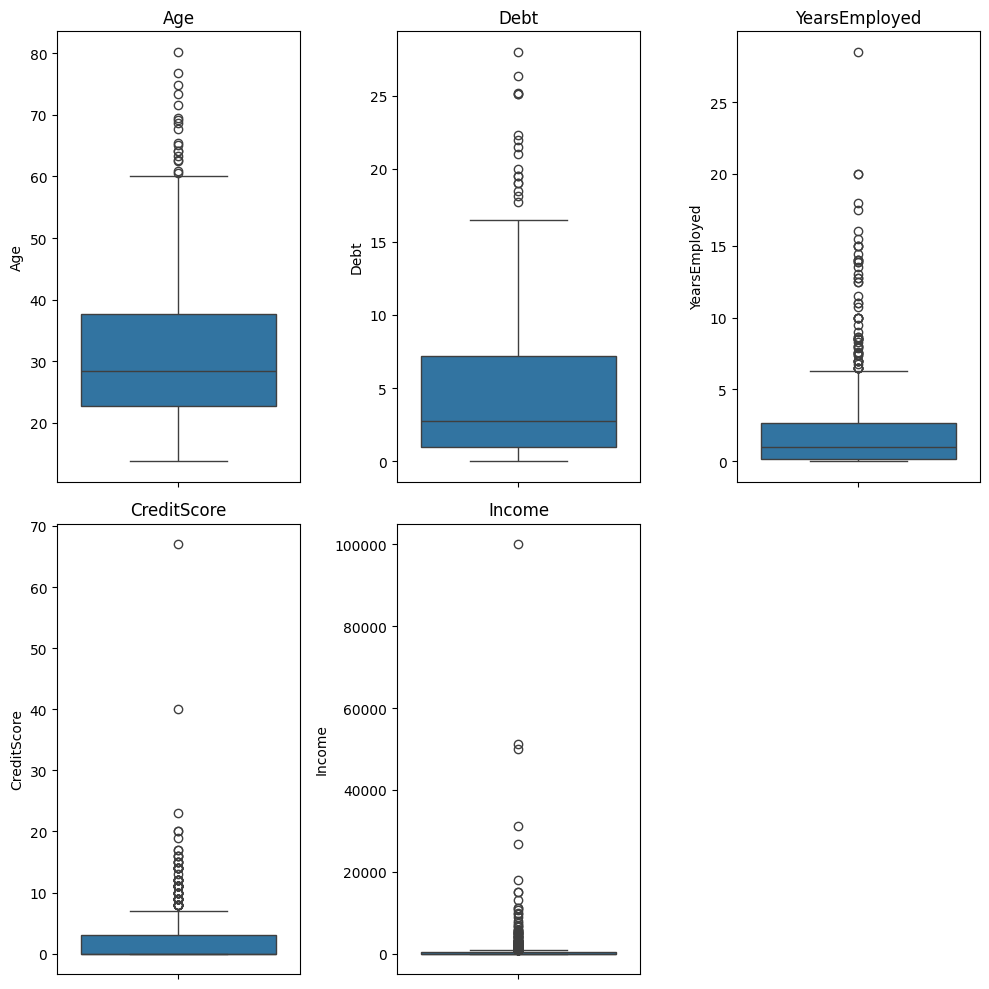

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

continuous_cols = ['Age', 'Debt', 'YearsEmployed', 'CreditScore', 'Income']

plt.figure(figsize=(10, 10))
for i, col in enumerate(continuous_cols):
    plt.subplot(2, 3, i + 1)
    sns.boxplot(y=data[col])
    plt.title(col)
plt.tight_layout()
plt.show()


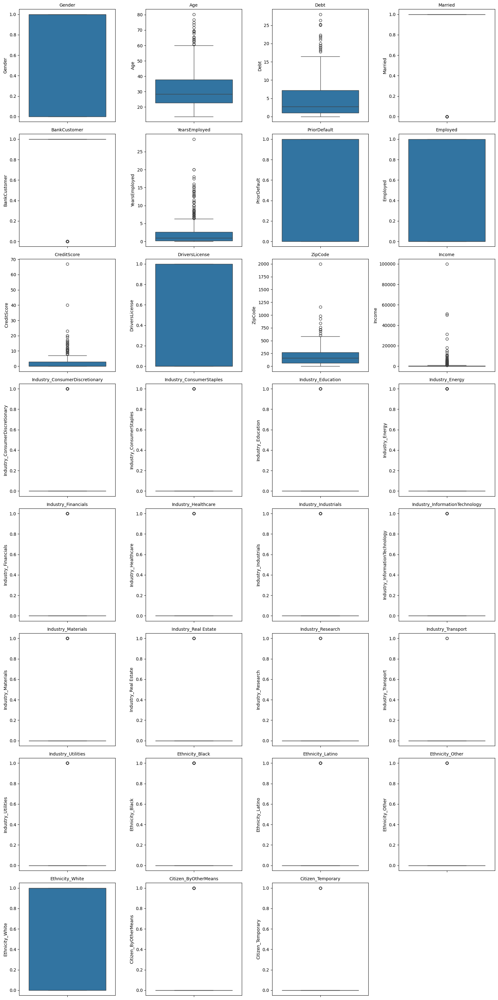

In [ ]:
# Select only numeric columns (excluding bool)
numeric_cols = data.select_dtypes(include=np.number).columns

if 'Approved' in numeric_cols:
    numeric_cols = numeric_cols.drop('Approved')


n_cols = len(numeric_cols)
rows = int(np.ceil(n_cols / 4))
cols = min(4, n_cols)


plt.figure(figsize=(cols * 4, rows * 4))


for i, col in enumerate(numeric_cols):
    plt.subplot(rows, cols, i + 1)
    sns.boxplot(y=data[col])
    plt.title(col, fontsize=10)

plt.tight_layout()
plt.show()

---->**Finding** the correlation  **columns**

In [ ]:
target_column = 'Approved'
correlation = data.corr(numeric_only=True)[target_column].sort_values(ascending=False)

In [ ]:
print("Correlation of each column with target variable:")
correlation

Correlation of each column with target variable:


,Approved
Approved,1.000000
PriorDefault,0.720407
Employed,0.458301
CreditScore,0.406410
YearsEmployed,0.322475
Debt,0.206294
Industry_Utilities,0.192945
BankCustomer,0.188964
Ethnicity_Black,0.186643
Married,0.180583


In [ ]:
data.head(5)

,Gender,Age,Debt,Married,BankCustomer,YearsEmployed,PriorDefault,Employed,CreditScore,DriversLicense,...,Industry_Real Estate,Industry_Research,Industry_Transport,Industry_Utilities,Ethnicity_Black,Ethnicity_Latino,Ethnicity_Other,Ethnicity_White,Citizen_ByOtherMeans,Citizen_Temporary
0,1,30.83,0.000,1,1,1.25,1,1,1,0,...,0,0,0,0,0,0,0,1,0,0
1,0,58.67,4.460,1,1,3.04,1,1,6,0,...,0,0,0,0,1,0,0,0,0,0
2,0,24.50,0.500,1,1,1.50,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,1,27.83,1.540,1,1,3.75,1,1,5,1,...,0,0,0,0,0,0,0,1,0,0
4,1,20.17,5.625,1,1,1.71,1,0,0,0,...,0,0,0,0,0,0,0,1,1,0


In [ ]:
data.isnull().sum()

,0
Gender,0
Age,0
Debt,0
Married,0
BankCustomer,0
YearsEmployed,0
PriorDefault,0
Employed,0
CreditScore,0
DriversLicense,0


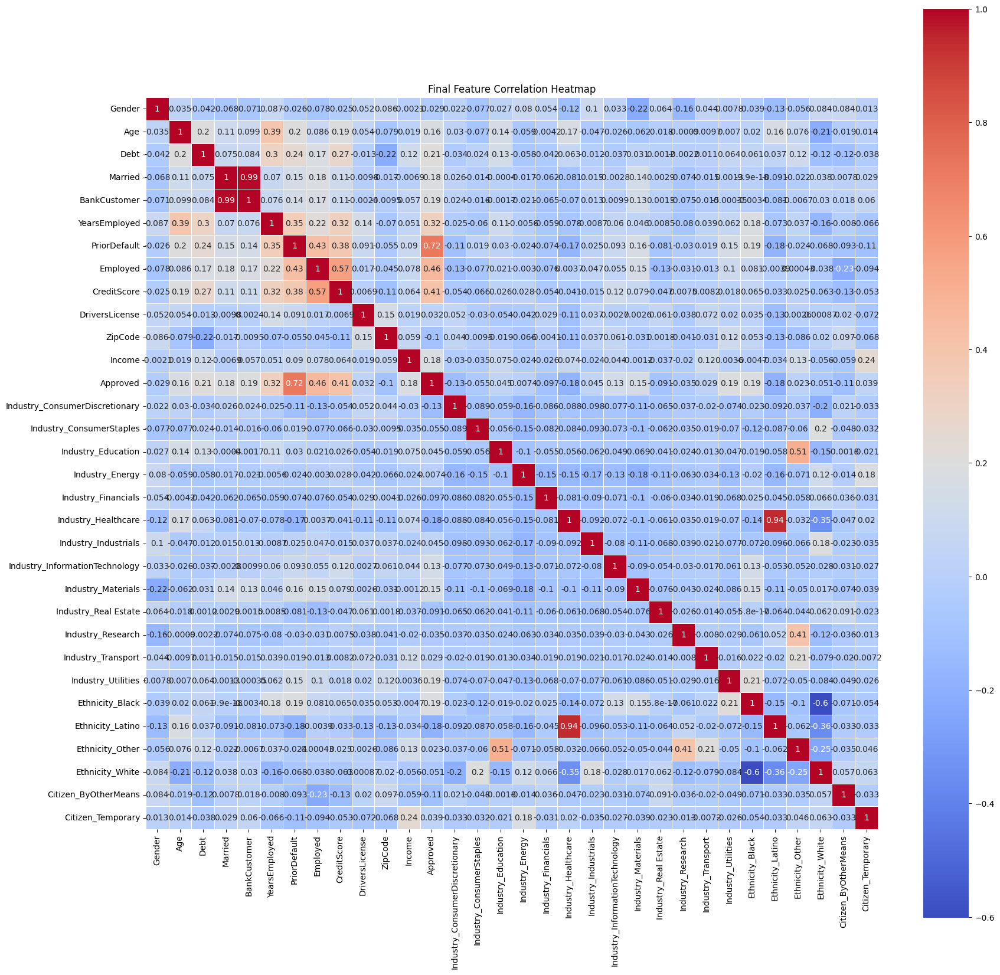

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 20))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm', square=True, linewidths=0.5)
plt.title("Final Feature Correlation Heatmap")
plt.show()

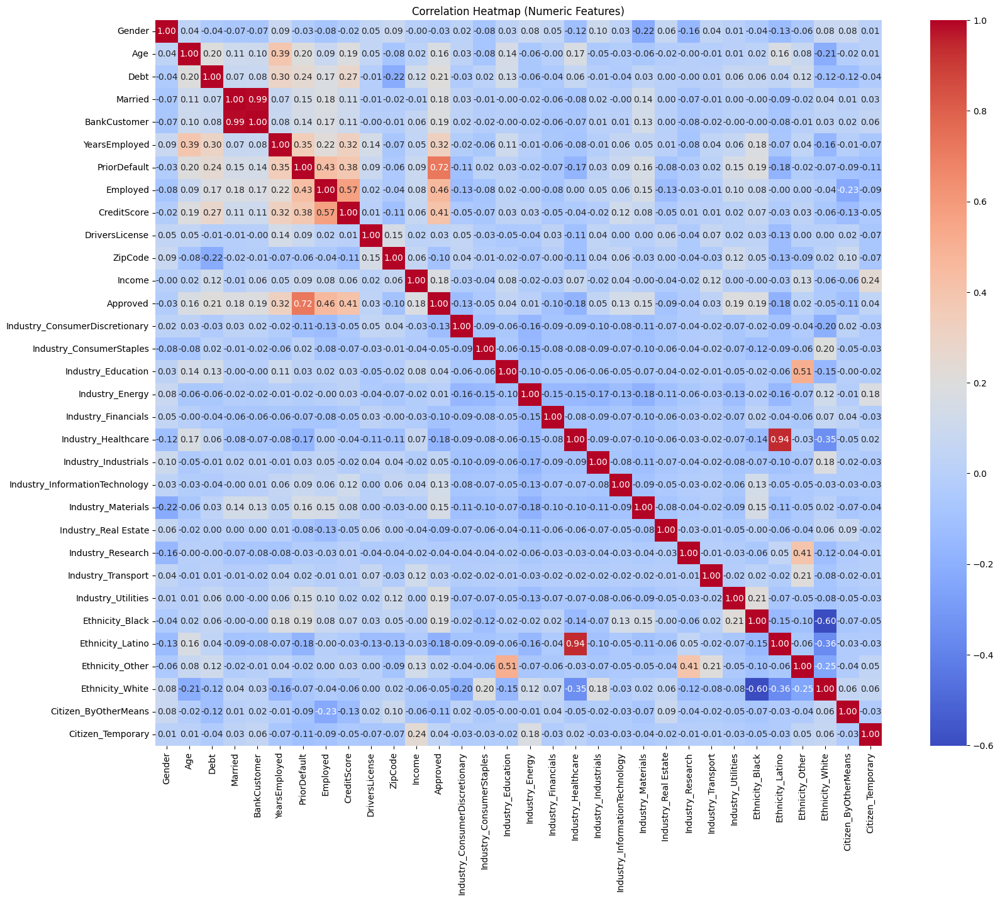

In [ ]:
# Select numeric columns only (exclude binary bools)
numeric_cols = data.select_dtypes(include=['int64', 'float64']).columns
corr = data[numeric_cols].corr()

plt.figure(figsize=(20, 15))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", square=True)
plt.title("Correlation Heatmap (Numeric Features)")
plt.show()


In [ ]:
data= data.drop(['customerID','Timestamp'],errors='ignore')
data

,Gender,Age,Debt,Married,BankCustomer,YearsEmployed,PriorDefault,Employed,CreditScore,DriversLicense,...,Industry_Real Estate,Industry_Research,Industry_Transport,Industry_Utilities,Ethnicity_Black,Ethnicity_Latino,Ethnicity_Other,Ethnicity_White,Citizen_ByOtherMeans,Citizen_Temporary
0,1,30.83,0.000,1,1,1.25,1,1,1,0,...,0,0,0,0,0,0,0,1,0,0
1,0,58.67,4.460,1,1,3.04,1,1,6,0,...,0,0,0,0,1,0,0,0,0,0
2,0,24.50,0.500,1,1,1.50,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,1,27.83,1.540,1,1,3.75,1,1,5,1,...,0,0,0,0,0,0,0,1,0,0
4,1,20.17,5.625,1,1,1.71,1,0,0,0,...,0,0,0,0,0,0,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
685,1,21.08,10.085,0,0,1.25,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
686,0,22.67,0.750,1,1,2.00,0,1,2,1,...,0,0,0,0,0,0,0,1,0,0
687,0,25.25,13.500,0,0,2.00,0,1,1,1,...,0,0,0,0,0,1,0,0,0,0
688,1,17.92,0.205,1,1,0.04,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [ ]:
data['Approved'].value_counts(normalize=True)
 #55% not approved
 #44% are approved

,proportion
Approved,
0,0.555072
1,0.444928


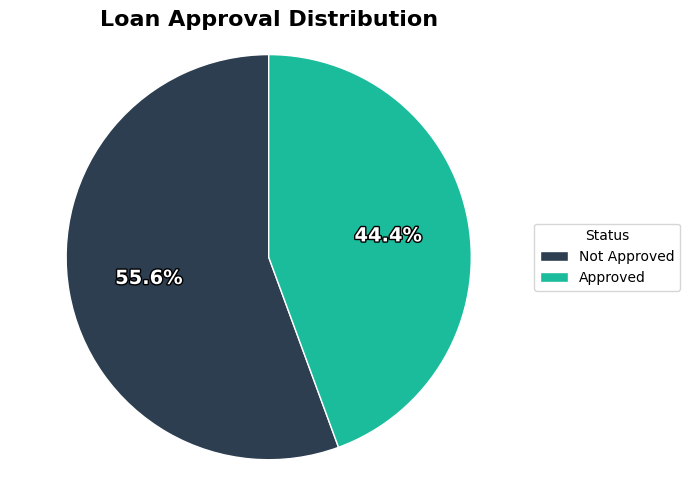

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patheffects as path_effects

labels = ['Not Approved', 'Approved']
sizes = [55.6, 44.4]
colors = ['#2C3E50', '#1ABC9C']

plt.figure(figsize=(7,5))

# Create pie chart
wedges, texts, autotexts = plt.pie(
    sizes,
    labels=None,   # No text inside except %
    colors=colors,
    autopct='%1.1f%%',
    startangle=90,
    textprops={'fontsize': 14, 'weight': 'bold', 'color': 'white'},
    wedgeprops={'edgecolor': 'white'}
)

# Style % labels
for autotext in autotexts:
    autotext.set_fontsize(14)
    autotext.set_weight("bold")
    autotext.set_path_effects([
        path_effects.Stroke(linewidth=2, foreground='black'),
        path_effects.Normal()
    ])

# Title
plt.title('Loan Approval Distribution', fontsize=16, fontweight='bold')

# Legend outside
plt.legend(labels, title="Status", loc="center left", bbox_to_anchor=(1, 0.5))

plt.axis('equal')
plt.tight_layout()
plt.show()


In [ ]:
from sklearn.preprocessing import StandardScaler

# List of numeric columns to scale
num_cols = ['Age','Debt' ,'Married' ,'YearsEmployed' ,'CreditScore'  ,'Income','Approved']

scaler = StandardScaler()
data[num_cols] = scaler.fit_transform(data[num_cols])

print(" Scaled numerical features.")

 Scaled numerical features.


In [ ]:
# Update numeric_cols to include only columns present in data
numeric_cols_present = [col for col in numeric_cols if col in data.columns]

sns.pairplot(data[numeric_cols_present], diag_kind='kde')
plt.suptitle("Pairplot of Numerical Features", y=1.02)
plt.show()

In [ ]:
# Update numeric_cols to include only columns present in data
numeric_cols_present = [col for col in numeric_cols if col in data.columns]

Q1 = data[numeric_cols_present].quantile(0.25)
Q3 = data[numeric_cols_present].quantile(0.75)
IQR = Q3 - Q1
iqr_filter = ~((data[numeric_cols_present] < (Q1 - 1.5 * IQR)) |
               (data[numeric_cols_present] > (Q3 + 1.5 * IQR))).any(axis=1)

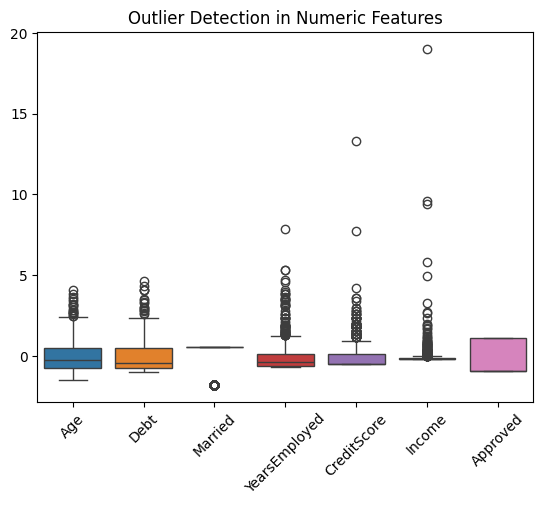

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Boxplot to check for outliers
sns.boxplot(data=data[num_cols])
plt.xticks(rotation=45)
plt.title("Outlier Detection in Numeric Features")
plt.show()


In [ ]:
def cap_outliers(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    data[column] = data[column].clip(lower, upper)

# Apply to numeric features
for col in ['Age', 'Debt', 'YearsEmployed', 'CreditScore', 'Income']:
    cap_outliers(data, col)

print(" Outliers capped using IQR method.")


 Outliers capped using IQR method.


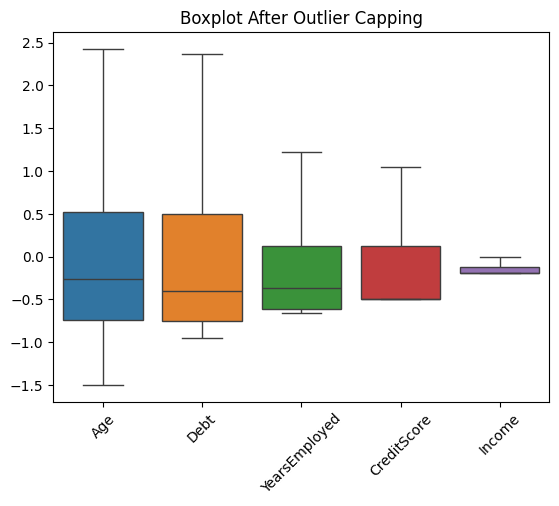

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Boxplot after outlier handling
sns.boxplot(data=data[['Age', 'Debt', 'YearsEmployed', 'CreditScore', 'Income']])
plt.xticks(rotation=45)
plt.title("Boxplot After Outlier Capping")
plt.show()


In [ ]:
data.shape

(690, 32)

In [ ]:
data['Approved'] = data['Approved'].replace({-1: 0, 1: 1})


In [ ]:
print(data['Approved'].value_counts())
print("Mean:", data['Approved'].mean())
print("Std Dev:", data['Approved'].std())


Approved
-0.895303    383
 1.116941    307
Name: count, dtype: int64
Mean: -1.647635329298783e-16
Std Dev: 1.0007254262832894


In [ ]:
data['Approved'] = data['Approved'].astype(int)


In [ ]:
print(data['Approved'].value_counts())


Approved
0    383
1    307
Name: count, dtype: int64


In [ ]:
print("Mean:", data['Approved'].mean())
print("Std Dev:", data['Approved'].std())


Mean: 0.4449275362318841
Std Dev: 0.4973182747893917


In [ ]:
print(data['Approved'].value_counts())


Approved
0    383
1    307
Name: count, dtype: int64


#EXPLORATRY DATA ANALYSIS

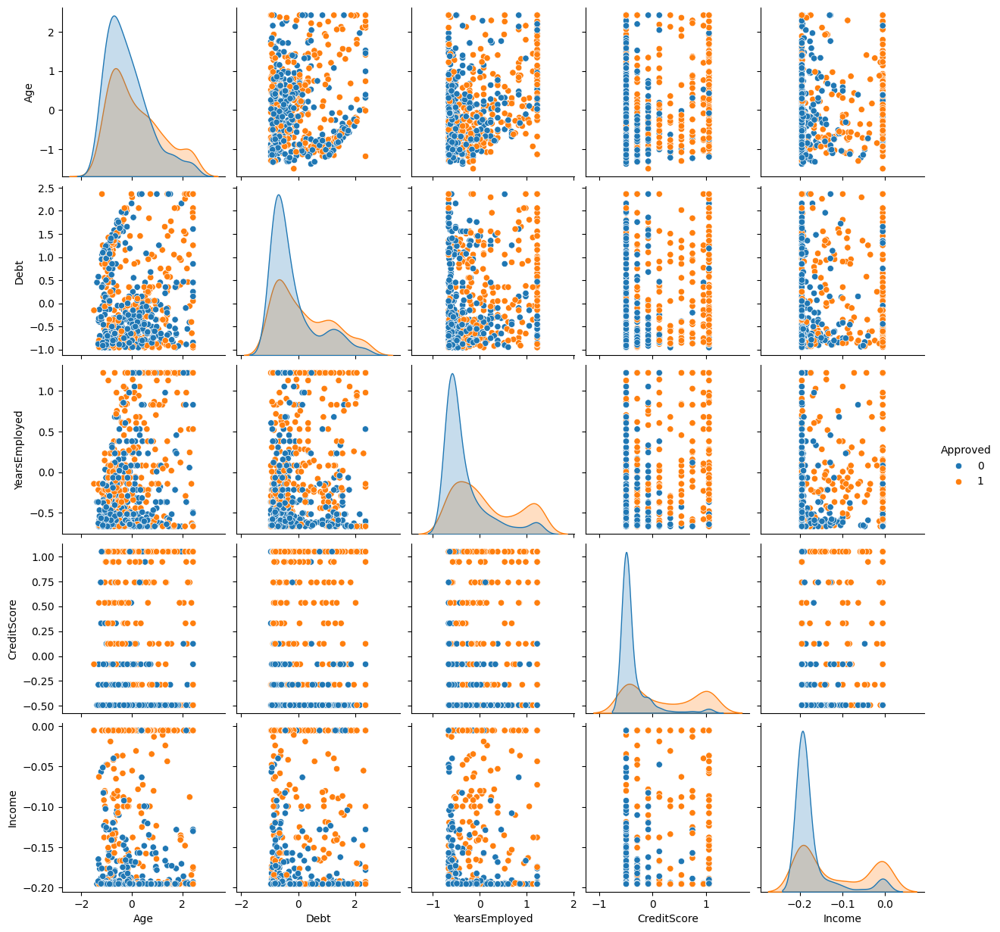

In [ ]:

import pandas as pd, seaborn as sns, matplotlib.pyplot as plt
sns.pairplot(data[['Age', 'Debt', 'YearsEmployed', 'CreditScore', 'Income', 'Approved']], hue='Approved')
plt.show()


/tmp/ipython-input-3543012680.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Approved', data=data, palette='Set2')


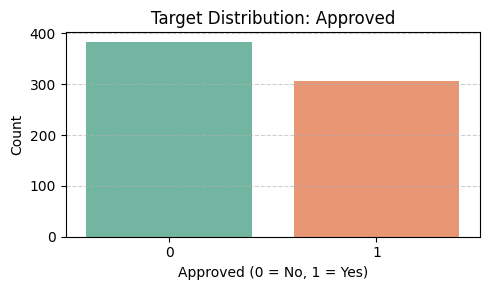

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(5, 3))
sns.countplot(x='Approved', data=data, palette='Set2')
plt.title("Target Distribution: Approved")
plt.xlabel("Approved (0 = No, 1 = Yes)")
plt.ylabel("Count")
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


In [ ]:
print(data['Approved'].value_counts())
print(data['Approved'].value_counts(normalize=True))

Approved
0    383
1    307
Name: count, dtype: int64
Approved
0    0.555072
1    0.444928
Name: proportion, dtype: float64


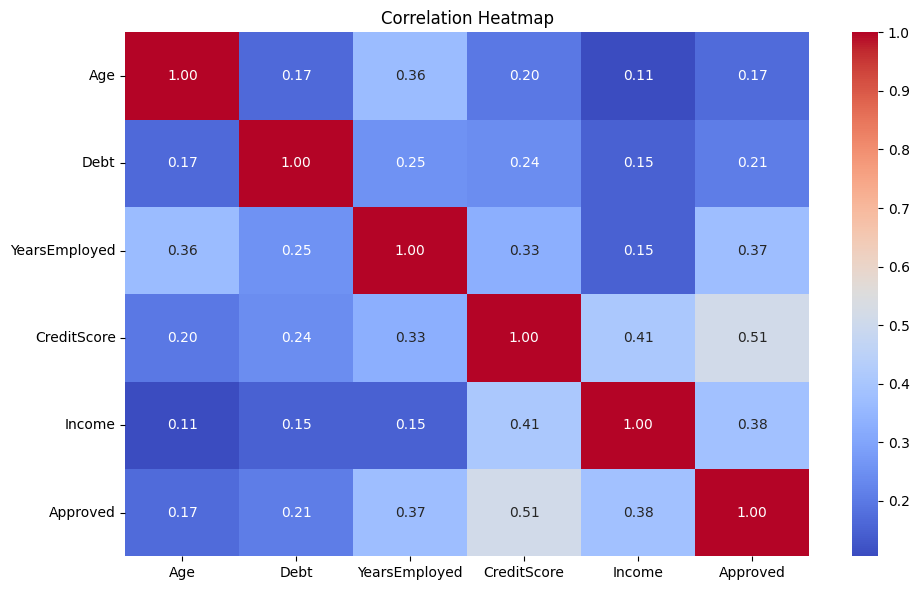

In [ ]:
numerical_features = ['Age', 'Debt', 'YearsEmployed', 'CreditScore', 'Income']
plt.figure(figsize=(10, 6))
sns.heatmap(data[numerical_features + ['Approved']].corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Correlation Heatmap")
plt.tight_layout()
plt.show()

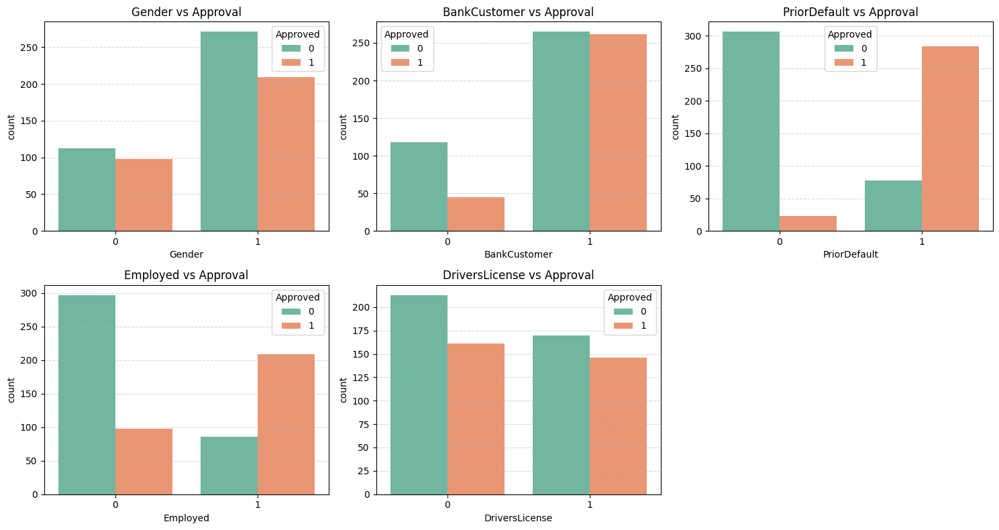

In [ ]:
categorical_features = ['Gender', 'BankCustomer', 'PriorDefault', 'Employed', 'DriversLicense']

plt.figure(figsize=(15, 8))
for i, col in enumerate(categorical_features):
    plt.subplot(2, 3, i+1)  # 2 rows, 3 columns
    sns.countplot(x=col, hue='Approved', data=data, palette='Set2')
    plt.title(f'{col} vs Approval')
    plt.grid(True, axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

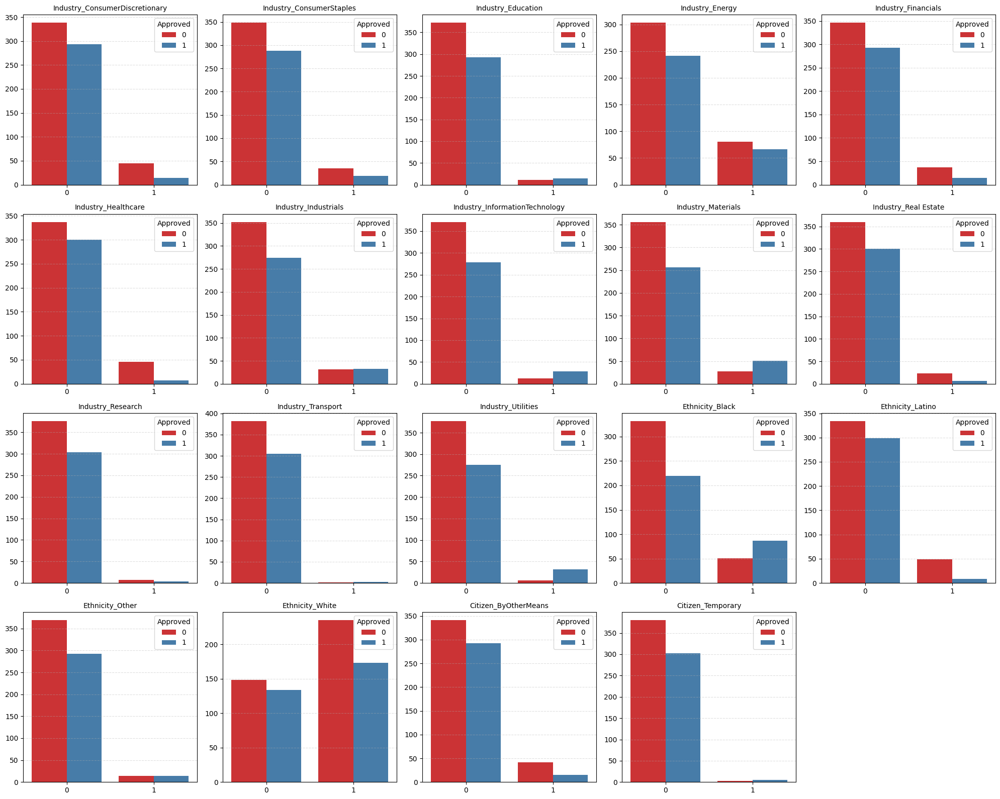

In [ ]:
extended_categorical_features = [
    'Industry_ConsumerDiscretionary', 'Industry_ConsumerStaples', 'Industry_Education',
    'Industry_Energy', 'Industry_Financials', 'Industry_Healthcare', 'Industry_Industrials',
    'Industry_InformationTechnology', 'Industry_Materials', 'Industry_Real Estate',
    'Industry_Research', 'Industry_Transport', 'Industry_Utilities',
    'Ethnicity_Black', 'Ethnicity_Latino', 'Ethnicity_Other', 'Ethnicity_White',
    'Citizen_ByOtherMeans', 'Citizen_Temporary'
]

# Set up the subplot grid (4 rows × 5 columns)
plt.figure(figsize=(20, 16))
for i, col in enumerate(extended_categorical_features):
    plt.subplot(4, 5, i + 1)
    sns.countplot(x=col, hue='Approved', data=data, palette='Set1')
    plt.title(col, fontsize=10)
    plt.xlabel('')
    plt.ylabel('')
    plt.grid(True, axis='y', linestyle='--', alpha=0.4)
    plt.tight_layout()

plt.show()

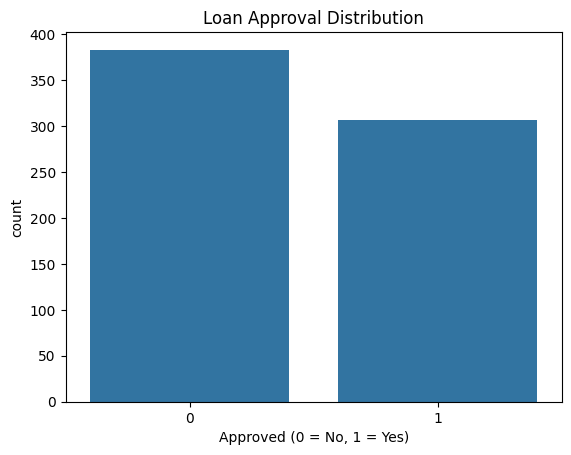

Approved
0    0.555072
1    0.444928
Name: proportion, dtype: float64


In [ ]:
sns.countplot(x='Approved', data=data)
plt.title("Loan Approval Distribution")
plt.xlabel("Approved (0 = No, 1 = Yes)")
plt.show()

print(data['Approved'].value_counts(normalize=True))


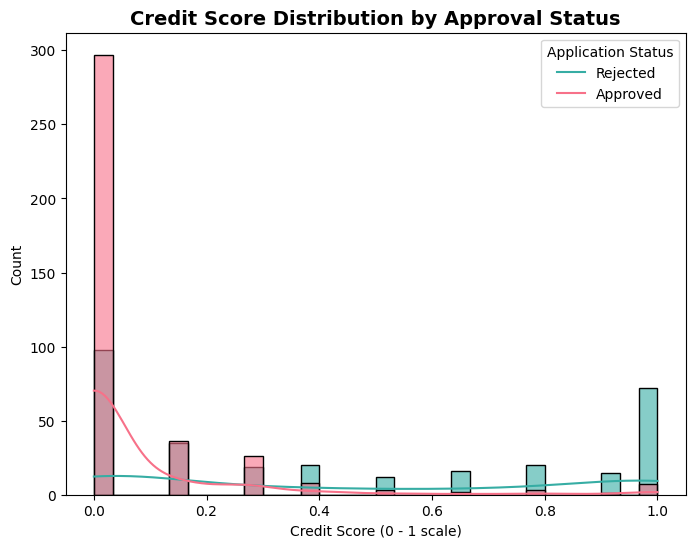

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Create a copy of CreditScore
data['CreditScore_rescaled'] = MinMaxScaler().fit_transform(
    data[['CreditScore']]
)

# Plot again
plt.figure(figsize=(8,6))
sns.histplot(
    data=data,
    x='CreditScore_rescaled',
    hue='Approved',
    kde=True,
    bins=30,
    palette='husl',
    alpha=0.6
)
plt.title("Credit Score Distribution by Approval Status", fontsize=14, fontweight='bold')
plt.xlabel("Credit Score (0 - 1 scale)")
plt.ylabel("Count")
plt.legend(title="Application Status", labels=["Rejected", "Approved"])
plt.show()


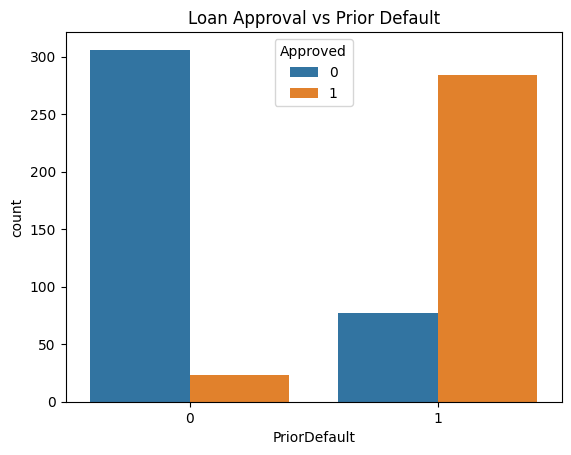

In [ ]:
sns.countplot(x='PriorDefault', hue='Approved', data=data)
plt.title("Loan Approval vs Prior Default")
plt.show()


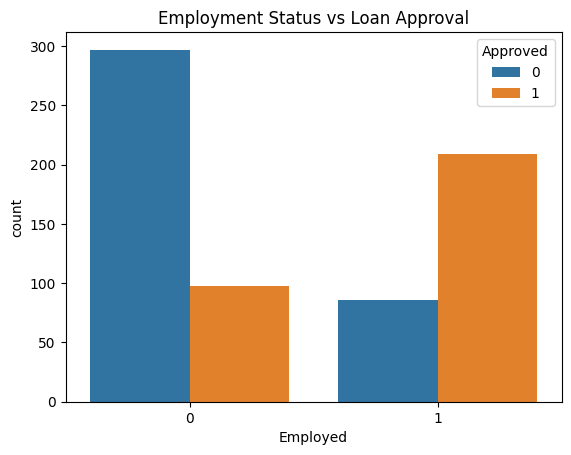

In [ ]:
sns.countplot(x='Employed', hue='Approved', data=data)
plt.title("Employment Status vs Loan Approval")
plt.show()


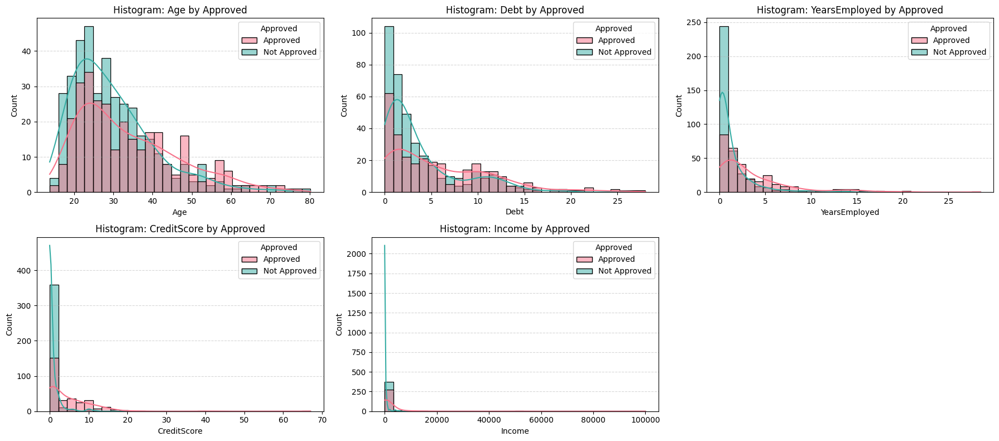

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Reload raw dataset
raw_data = pd.read_excel('/content/credit card_dataset.xlsx')

numerical_cols_for_plotting = ['Age', 'Debt', 'YearsEmployed', 'CreditScore', 'Income']
target_col = 'Approved'

# Map target values for readability
raw_data['Approved'] = raw_data['Approved'].map({0: 'Not Approved', 1: 'Approved'})

# Number of subplots
n_numerical_cols = len(numerical_cols_for_plotting)
n_cols_subplot = 3
n_rows_subplot = (n_numerical_cols + n_cols_subplot - 1) // n_cols_subplot

plt.figure(figsize=(n_cols_subplot * 6, n_rows_subplot * 4))

for i, numeric_col in enumerate(numerical_cols_for_plotting):
    plt.subplot(n_rows_subplot, n_cols_subplot, i + 1)
    sns.histplot(data=raw_data, x=numeric_col, hue=target_col, kde=True, bins=30, palette='husl')
    plt.title(f'Histogram: {numeric_col} by {target_col}')
    plt.xlabel(numeric_col)
    plt.ylabel('Count')
    plt.grid(True, axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


In [ ]:
# Z-score method (simple)
from scipy.stats import zscore
import numpy as np

# Calculate z-scores for the specified columns
z_scores = data[['Income', 'Debt', 'CreditScore']].apply(zscore)

# Create boolean columns to indicate outliers based on a threshold (e.g., |z-score| > 3)
for col in ['Income', 'Debt', 'CreditScore']:
    if col in z_scores.columns and z_scores[col].notna().any():
        data[f'Outlier_{col}'] = np.where(abs(z_scores[col]) > 3, 1, 0)


print("Outliers in each column (count based on z-score > 3):\n", data[['Outlier_Income', 'Outlier_Debt', 'Outlier_CreditScore']].sum())

Outliers in each column (count based on z-score > 3):
 Outlier_Income         0
Outlier_Debt           0
Outlier_CreditScore    0
dtype: int64


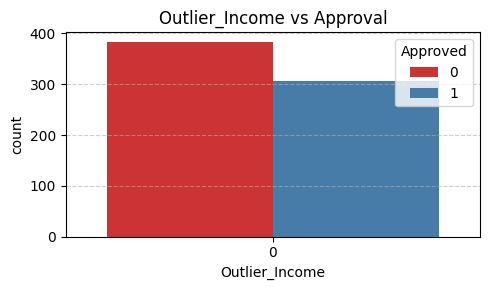

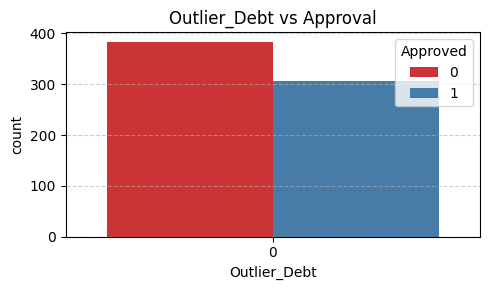

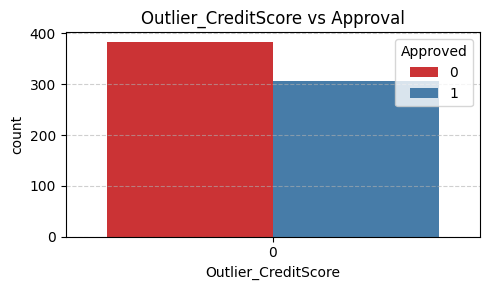

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

for col in ['Outlier_Income', 'Outlier_Debt', 'Outlier_CreditScore']:
    plt.figure(figsize=(5, 3))
    sns.countplot(x=col, hue='Approved', data=data, palette='Set1')
    plt.title(f"{col} vs Approval")
    plt.grid(True, axis='y', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()


In [ ]:
# Average CreditScore by Employment
print(data.groupby('Employed')['CreditScore'].mean())

# Approval rate by Ethnicity
print(data.groupby('Ethnicity_White')['Approved'].mean())

Employed
0   -0.493887
1    0.369369
Name: CreditScore, dtype: float64
Ethnicity_White
0    0.475177
1    0.424020
Name: Approved, dtype: float64


In [ ]:
industry_cols = [col for col in data.columns if col.startswith('Industry_')]
for col in industry_cols:
    print(f"{col}:\n", data.groupby(col)['Approved'].mean(), "\n")



Industry_ConsumerDiscretionary:
 Industry_ConsumerDiscretionary
0    0.464342
1    0.237288
Name: Approved, dtype: float64 

Industry_ConsumerStaples:
 Industry_ConsumerStaples
0    0.452830
1    0.351852
Name: Approved, dtype: float64 

Industry_Education:
 Industry_Education
0    0.440602
1    0.560000
Name: Approved, dtype: float64 

Industry_Energy:
 Industry_Energy
0    0.443015
1    0.452055
Name: Approved, dtype: float64 

Industry_Financials:
 Industry_Financials
0    0.458529
1    0.274510
Name: Approved, dtype: float64 

Industry_Healthcare:
 Industry_Healthcare
0    0.470958
1    0.132075
Name: Approved, dtype: float64 

Industry_Industrials:
 Industry_Industrials
0    0.437700
1    0.515625
Name: Approved, dtype: float64 

Industry_InformationTechnology:
 Industry_InformationTechnology
0    0.428351
1    0.707317
Name: Approved, dtype: float64 

Industry_Materials:
 Industry_Materials
0    0.418301
1    0.653846
Name: Approved, dtype: float64 

Industry_Real Estate:
 Indust

/tmp/ipython-input-3421419357.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


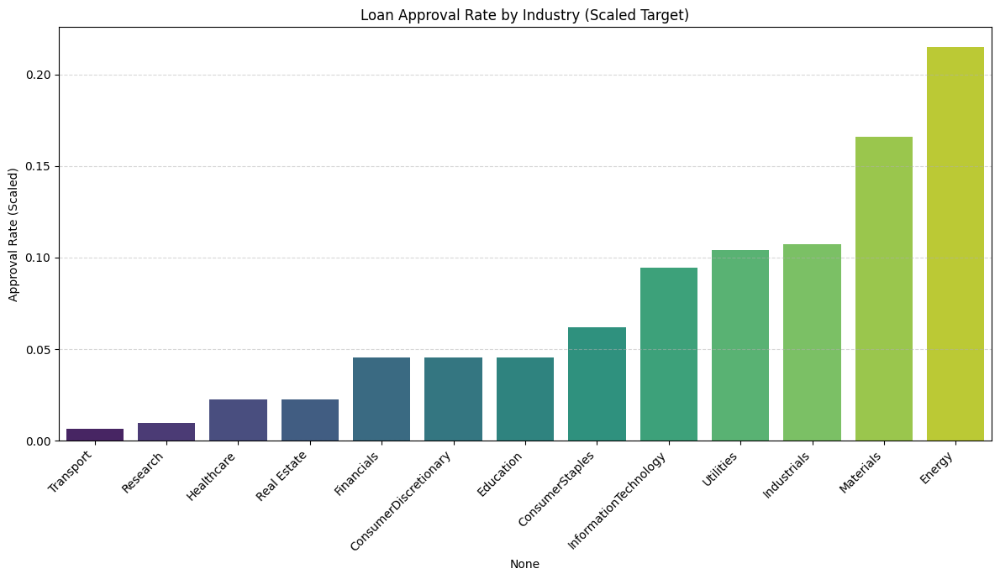

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# columns that start with 'Industry_'
industry_cols = [col for col in data.columns if col.startswith('Industry_')]

# Calculate the mean 'Approved' for each industry column
industry_approval_rates = data[industry_cols + ['Approved']].groupby('Approved')[industry_cols].mean().T

# Rename the index for better plotting
industry_approval_rates.index = industry_approval_rates.index.str.replace('Industry_', '')

approved_scaled_value = 1.116941
if approved_scaled_value not in industry_approval_rates.columns:
    approved_scaled_value = industry_approval_rates.mean(axis=0).idxmax()


industry_approval_rates_sorted = industry_approval_rates.sort_values(by=approved_scaled_value)


# Plot
plt.figure(figsize=(12, 7))
sns.barplot(
    x=industry_approval_rates_sorted.index,
    y=industry_approval_rates_sorted[approved_scaled_value].values,
    palette='viridis'
)
plt.xticks(rotation=45, ha='right')
plt.ylabel("Approval Rate (Scaled)")
plt.title("Loan Approval Rate by Industry (Scaled Target)")
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

#V I F

In [ ]:
x=data.drop('Approved',axis=1)
y=data['Approved']

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
import pandas as pd

# Exclude target + outlier flags
X = data.drop(columns=['Approved'] + [col for col in data.columns if col.startswith("Outlier_")])

# Calculate VIF
vif_data = pd.DataFrame()
vif_data["Feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Sort and reset index for clean order
vif_data = vif_data.sort_values(by="VIF", ascending=False).reset_index(drop=True)
vif_data.index.name = "Index"

vif_data


,Feature,VIF
Index,,
0,BankCustomer,59.115027
1,Married,14.866771
2,Ethnicity_Latino,13.228550
3,Industry_Healthcare,12.908091
4,Ethnicity_White,10.521028
5,Income,6.442837
6,Industry_Energy,4.889247
7,Employed,4.790579
8,Ethnicity_Black,4.189276


In [ ]:
x = data.drop(['Married','BankCustomer','Industry_Healthcare','Ethnicity_Latino','Ethnicity_White'], axis=1)

In [ ]:
data.columns

Index(['Gender', 'Age', 'Debt', 'Married', 'BankCustomer', 'YearsEmployed',
       'PriorDefault', 'Employed', 'CreditScore', 'DriversLicense', 'ZipCode',
       'Income', 'Approved', 'Industry_ConsumerDiscretionary',
       'Industry_ConsumerStaples', 'Industry_Education', 'Industry_Energy',
       'Industry_Financials', 'Industry_Healthcare', 'Industry_Industrials',
       'Industry_InformationTechnology', 'Industry_Materials',
       'Industry_Real Estate', 'Industry_Research', 'Industry_Transport',
       'Industry_Utilities', 'Ethnicity_Black', 'Ethnicity_Latino',
       'Ethnicity_Other', 'Ethnicity_White', 'Citizen_ByOtherMeans',
       'Citizen_Temporary', 'Outlier_Income', 'Outlier_Debt',
       'Outlier_CreditScore'],
      dtype='object')

In [ ]:
x = data.drop(['Married','BankCustomer','Industry_Healthcare','Ethnicity_Latino','Ethnicity_White'], axis=1)
y=data['Approved']

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
import pandas as pd

# Define X and y (drop target, high-VIF features, and outlier flags)
x = data.drop(columns=['Approved', 'Married', 'BankCustomer',
                       'Industry_Healthcare', 'Ethnicity_Latino', 'Ethnicity_White',
                       'Outlier_Income', 'Outlier_Debt', 'Outlier_CreditScore'],
              errors='ignore')

y = data["Approved"]

# Recalculate VIF (only on cleaned X)
vif_data = pd.DataFrame()
vif_data["Feature"] = x.columns
vif_data["VIF"] = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]

# Sort for clarity
vif_data = vif_data.sort_values(by="VIF", ascending=False).reset_index(drop=True)
vif_data.index.name = "Index"

vif_data


,Feature,VIF
Index,,
0,Income,5.103277
1,Employed,4.002023
2,Gender,3.324979
3,PriorDefault,3.193057
4,CreditScore,2.960789
5,ZipCode,2.353505
6,Industry_Energy,2.206552
7,Ethnicity_Other,2.089419
8,DriversLicense,2.006842


***Logistic Regression***

#  model 70-30

In [ ]:
data.shape

(690, 35)

In [ ]:
data.describe()

,Gender,Age,Debt,Married,BankCustomer,YearsEmployed,PriorDefault,Employed,CreditScore,DriversLicense,...,Industry_Utilities,Ethnicity_Black,Ethnicity_Latino,Ethnicity_Other,Ethnicity_White,Citizen_ByOtherMeans,Citizen_Temporary,Outlier_Income,Outlier_Debt,Outlier_CreditScore
count,690.000000,690.000000,690.000000,6.900000e+02,690.000000,690.000000,690.000000,690.000000,690.000000,690.000000,...,690.000000,690.00000,690.000000,690.000000,690.000000,690.000000,690.000000,690.0,690.0,690.0
mean,0.695652,-0.016631,-0.025376,-1.415937e-16,0.763768,-0.122245,0.523188,0.427536,-0.124814,0.457971,...,0.055072,0.20000,0.082609,0.040580,0.591304,0.082609,0.011594,0.0,0.0,0.0
std,0.460464,0.950830,0.919183,1.000725e+00,0.425074,0.614692,0.499824,0.495080,0.555982,0.498592,...,0.228287,0.40029,0.275490,0.197458,0.491949,0.275490,0.107128,0.0,0.0,0.0
min,0.000000,-1.498873,-0.956613,-1.783765e+00,0.000000,-0.664877,0.000000,0.000000,-0.493887,0.000000,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0
25%,0.000000,-0.746235,-0.755590,5.606119e-01,1.000000,-0.615536,0.000000,0.000000,-0.493887,0.000000,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0
50%,1.000000,-0.257695,-0.403800,5.606119e-01,1.000000,-0.365841,1.000000,0.000000,-0.493887,0.000000,...,0.000000,0.00000,0.000000,0.000000,1.000000,0.000000,0.000000,0.0,0.0,0.0
75%,1.000000,0.522576,0.492260,5.606119e-01,1.000000,0.120091,1.000000,1.000000,0.123472,1.000000,...,0.000000,0.00000,0.000000,0.000000,1.000000,0.000000,0.000000,0.0,0.0,0.0
max,1.000000,2.425792,2.364036,5.606119e-01,1.000000,1.223531,1.000000,1.000000,1.049509,1.000000,...,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,0.0,0.0



**Splitting data into tarin test**

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import classification_report, confusion_matrix

In [ ]:
drop_cols = ['Outlier_Income', 'Outlier_Debt', 'Outlier_CreditScore']
X = data.drop(columns=['Approved'] + drop_cols)
y = data['Approved']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


In [ ]:
# Model training
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)


LogisticRegression(max_iter=1000)

In [ ]:
y_pred = model.predict(X_test)
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))


Confusion Matrix:
 [[90 20]
 [15 82]]

Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.82      0.84       110
           1       0.80      0.85      0.82        97

    accuracy                           0.83       207
   macro avg       0.83      0.83      0.83       207
weighted avg       0.83      0.83      0.83       207



In [ ]:
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(y_test, y_pred)
print("\nExact Accuracy:", accuracy)
print("Exact Accuracy (%): {:.2f}%".format(accuracy * 100))


Exact Accuracy: 0.8309178743961353
Exact Accuracy (%): 83.09%


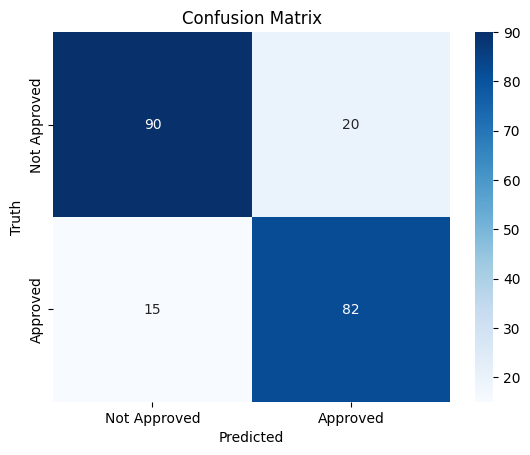

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

**KNN**

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
%matplotlib inline

**Split data**

In [ ]:
X = data.drop('Approved', axis=1)
y = data['Approved']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


*** Train the KNN model***

In [ ]:
#TEP 2: Train the KNN model
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)

KNeighborsClassifier()

**Predict on the TEST set**

In [ ]:
y_pred = knn.predict(X_test)


*** Evaluate accuracy***

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))


Accuracy: 0.6666666666666666


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))


[[85 25]
 [44 53]]
              precision    recall  f1-score   support

           0       0.66      0.77      0.71       110
           1       0.68      0.55      0.61        97

    accuracy                           0.67       207
   macro avg       0.67      0.66      0.66       207
weighted avg       0.67      0.67      0.66       207



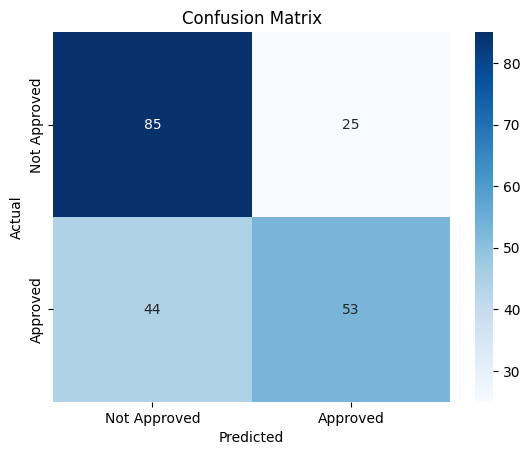

In [ ]:
from sklearn.metrics import confusion_matrix

# Recalculate the confusion matrix (assuming y_test and y_pred are available from previous cells)
cm = confusion_matrix(y_test, y_pred)

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Approved', 'Approved'], yticklabels=['Not Approved', 'Approved'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

**DECISION TREE**

In [ ]:
from sklearn.tree import DecisionTreeClassifier
model_dt = DecisionTreeClassifier(random_state=42)
model_dt.fit(X_train, y_train)
y_pred_dt = model_dt.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

print("Accuracy:", accuracy_score(y_test, y_pred_dt))
print("\nClassification Report:\n", classification_report(y_test, y_pred_dt))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_dt))

Accuracy: 0.7874396135265701

Classification Report:
               precision    recall  f1-score   support

           0       0.78      0.83      0.81       110
           1       0.79      0.74      0.77        97

    accuracy                           0.79       207
   macro avg       0.79      0.78      0.79       207
weighted avg       0.79      0.79      0.79       207


Confusion Matrix:
 [[91 19]
 [25 72]]


In [ ]:
accuracy_score(y_test, y_pred_dt)

0.7874396135265701

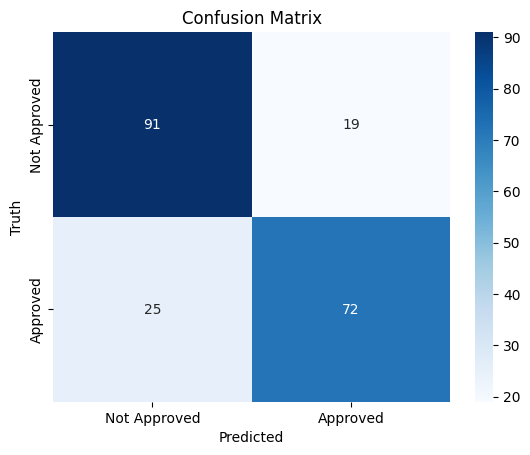

In [ ]:
from sklearn.metrics import confusion_matrix
cm_dt = confusion_matrix(y_test,y_pred_dt)
sns.heatmap(cm_dt, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

**svc**

In [ ]:
from sklearn import svm
model_svm=svm.SVC(class_weight='balanced',kernel='rbf',gamma = "scale")
model_svm.fit(X_train,y_train)
y_pred_svm=model_svm.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
print(accuracy_score(y_test,y_pred_svm))
print(classification_report(y_test,y_pred_svm))
print(confusion_matrix(y_test,y_pred_svm))

0.5893719806763285
              precision    recall  f1-score   support

           0       0.61      0.65      0.63       110
           1       0.57      0.53      0.55        97

    accuracy                           0.59       207
   macro avg       0.59      0.59      0.59       207
weighted avg       0.59      0.59      0.59       207

[[71 39]
 [46 51]]


In [ ]:
accuracy_score(y_test, y_pred_svm)

0.5893719806763285

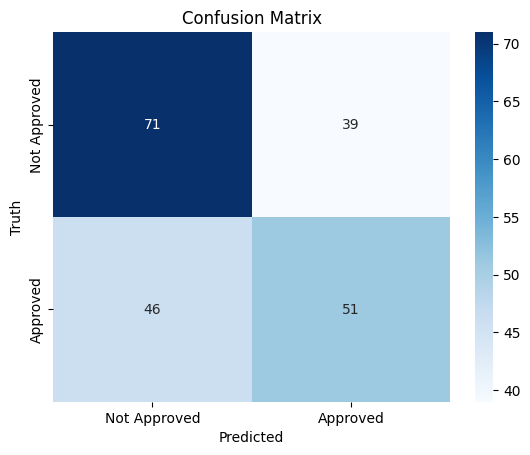

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm_svm = confusion_matrix(y_test, y_pred_svm)
sns.heatmap(cm_svm, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

**random forest**

In [ ]:
from sklearn.ensemble import RandomForestClassifier
model_rf=RandomForestClassifier()
model_rf.fit(X_train,y_train)
y_pred_rf=model_rf.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

print("Accuracy:", accuracy_score(y_test, y_pred_rf))
print("\nClassification Report:\n", classification_report(y_test, y_pred_rf))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_rf))

Accuracy: 0.855072463768116

Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.87      0.86       110
           1       0.85      0.84      0.84        97

    accuracy                           0.86       207
   macro avg       0.85      0.85      0.85       207
weighted avg       0.86      0.86      0.85       207


Confusion Matrix:
 [[96 14]
 [16 81]]


In [ ]:
accuracy_score(y_test, y_pred_rf)

0.855072463768116

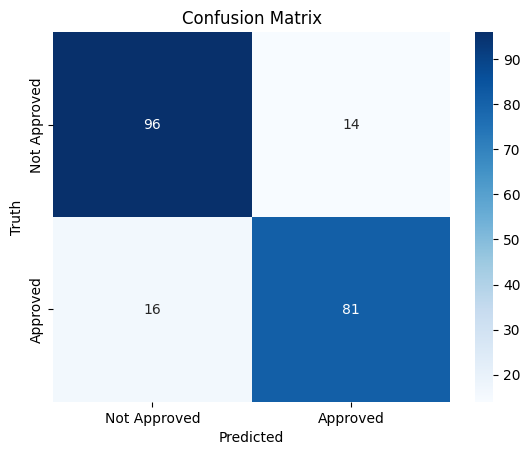

In [ ]:
from sklearn.metrics import confusion_matrix
cm_rf = confusion_matrix(y_test,y_pred_rf)
cm_rf
sns.heatmap(cm_rf, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

**Bagging**

In [ ]:
from sklearn.ensemble import BaggingClassifier
BGG = BaggingClassifier()
BGG.fit(X_train, y_train)
y_pred_bgg = BGG.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

print("Accuracy:", accuracy_score(y_test, y_pred_bgg))
print("\nClassification Report:\n", classification_report(y_test, y_pred_bgg))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_bgg))

Accuracy: 0.8454106280193237

Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.87      0.86       110
           1       0.85      0.81      0.83        97

    accuracy                           0.85       207
   macro avg       0.85      0.84      0.84       207
weighted avg       0.85      0.85      0.85       207


Confusion Matrix:
 [[96 14]
 [18 79]]


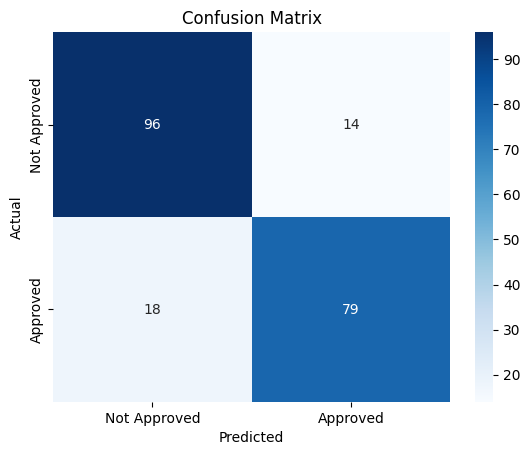

In [ ]:
from sklearn.metrics import confusion_matrix
cm_bgg= confusion_matrix(y_test,y_pred_bgg)
sns.heatmap(cm_bgg, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [ ]:
accuracy_score(y_test, y_pred_bgg)

0.8454106280193237

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
model_ada = AdaBoostClassifier()
model_ada.fit(X_train, y_train)
y_pred_ada = model_ada.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

print("Accuracy:", accuracy_score(y_test, y_pred_ada))
print("\nClassification Report:\n", classification_report(y_test, y_pred_ada))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_ada))

Accuracy: 0.8309178743961353

Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.81      0.84       110
           1       0.80      0.86      0.83        97

    accuracy                           0.83       207
   macro avg       0.83      0.83      0.83       207
weighted avg       0.83      0.83      0.83       207


Confusion Matrix:
 [[89 21]
 [14 83]]


In [ ]:
accuracy_score(y_test, y_pred_ada)

0.8309178743961353

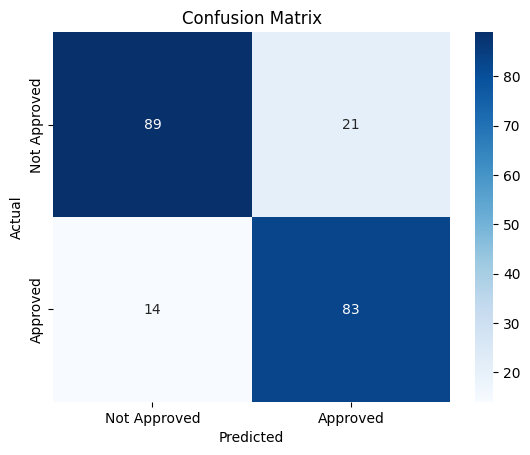

In [ ]:
from sklearn.metrics import confusion_matrix
cm_ada = confusion_matrix(y_test,y_pred_ada)
sns.heatmap(cm_ada, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [ ]:
base_estimator = RandomForestClassifier(max_depth=12, random_state=42)
br = AdaBoostClassifier(estimator=base_estimator, n_estimators=100, learning_rate=0.05)

br = br.fit(X_train,y_train)
y_pred_br = br.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
print(accuracy_score(y_test,y_pred_br))
print(classification_report(y_test,y_pred_br))
print(confusion_matrix(y_test,y_pred_br))

0.8599033816425121
              precision    recall  f1-score   support

           0       0.86      0.88      0.87       110
           1       0.86      0.84      0.85        97

    accuracy                           0.86       207
   macro avg       0.86      0.86      0.86       207
weighted avg       0.86      0.86      0.86       207

[[97 13]
 [16 81]]


In [ ]:
accuracy_score(y_test, y_pred_br)

0.8599033816425121

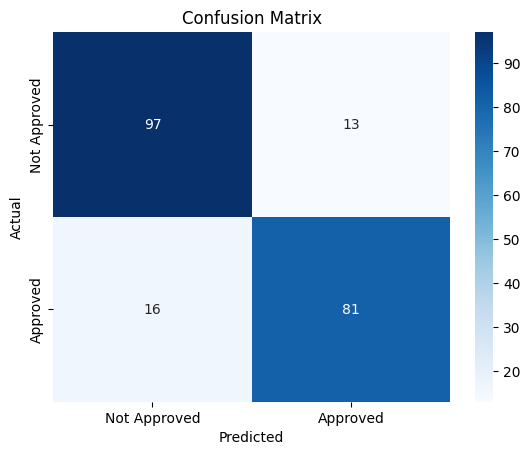

In [ ]:
from sklearn.metrics import confusion_matrix
cm_br = confusion_matrix(y_test,y_pred_br)
sns.heatmap(cm_br, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
model_gb=GradientBoostingClassifier()
model_gb.fit(X_train,y_train)
y_pred_gb=model_gb.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
print(accuracy_score(y_test,y_pred_gb))
print(classification_report(y_test,y_pred_gb))
print(confusion_matrix(y_test,y_pred_gb))

0.8599033816425121
              precision    recall  f1-score   support

           0       0.89      0.84      0.86       110
           1       0.83      0.89      0.86        97

    accuracy                           0.86       207
   macro avg       0.86      0.86      0.86       207
weighted avg       0.86      0.86      0.86       207

[[92 18]
 [11 86]]


In [ ]:
accuracy_score(y_test, y_pred_gb)

0.8599033816425121

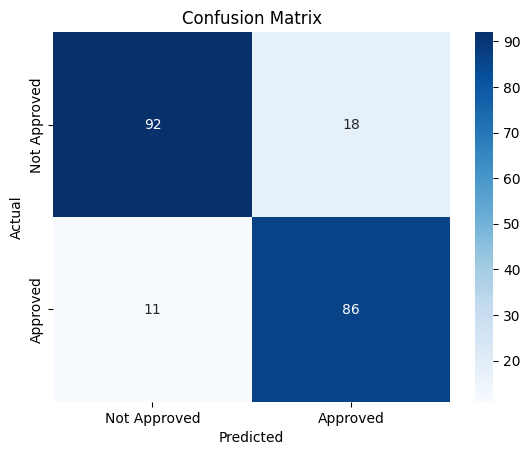

In [ ]:
from sklearn.metrics import confusion_matrix
cm_gb = confusion_matrix(y_test,y_pred_gb)
sns.heatmap(cm_gb, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [ ]:
from xgboost import XGBClassifier
model_xgb=XGBClassifier()
model_xgb.fit(X_train,y_train)
y_pred_xgb=model_xgb.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
print(accuracy_score(y_test,y_pred_xgb))
print(classification_report(y_test,y_pred_xgb))
print(confusion_matrix(y_test,y_pred_xgb))

0.8357487922705314
              precision    recall  f1-score   support

           0       0.84      0.85      0.85       110
           1       0.83      0.81      0.82        97

    accuracy                           0.84       207
   macro avg       0.84      0.83      0.83       207
weighted avg       0.84      0.84      0.84       207

[[94 16]
 [18 79]]


In [ ]:
accuracy_score(y_test, y_pred_xgb)

0.8357487922705314

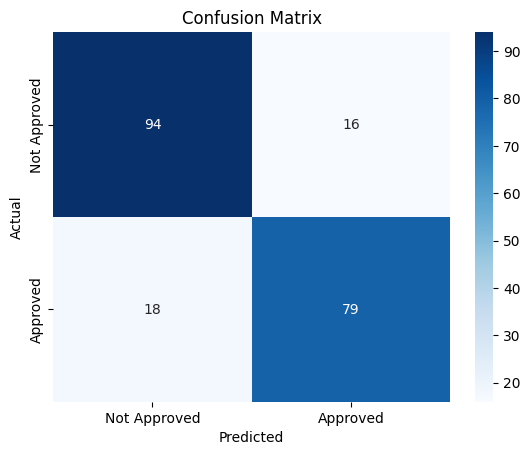

In [ ]:
from sklearn.metrics import confusion_matrix
cm_xgb = confusion_matrix(y_test,y_pred_xgb)
sns.heatmap(cm_xgb, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

step 44

In [ ]:
x.shape

(690, 26)

# 60-40

In [ ]:
X = data.drop('Approved', axis=1)
y = data['Approved']



In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)


In [ ]:
# Model training
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)


LogisticRegression(max_iter=1000)

In [ ]:
y_pred = model.predict(X_test)
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))


Confusion Matrix:
 [[123  28]
 [ 17 108]]

Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.81      0.85       151
           1       0.79      0.86      0.83       125

    accuracy                           0.84       276
   macro avg       0.84      0.84      0.84       276
weighted avg       0.84      0.84      0.84       276



In [ ]:
# Cross-validation
cv_scores = cross_val_score(model, X, y, cv=5)
print("Cross-Validation Accuracy Scores:", cv_scores)
print("Mean Cross-Validation Accuracy:", cv_scores.mean())


Cross-Validation Accuracy Scores: [0.63043478 0.96376812 0.9057971  0.79710145 0.91304348]
Mean Cross-Validation Accuracy: 0.8420289855072463


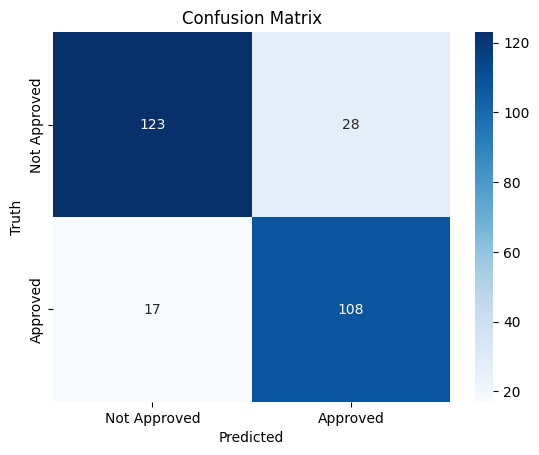

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
# Train the KNN model
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [ ]:
y_pred = knn.predict(X_test)


In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))


Accuracy: 0.677536231884058


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))


[[121  30]
 [ 59  66]]
              precision    recall  f1-score   support

           0       0.67      0.80      0.73       151
           1       0.69      0.53      0.60       125

    accuracy                           0.68       276
   macro avg       0.68      0.66      0.66       276
weighted avg       0.68      0.68      0.67       276



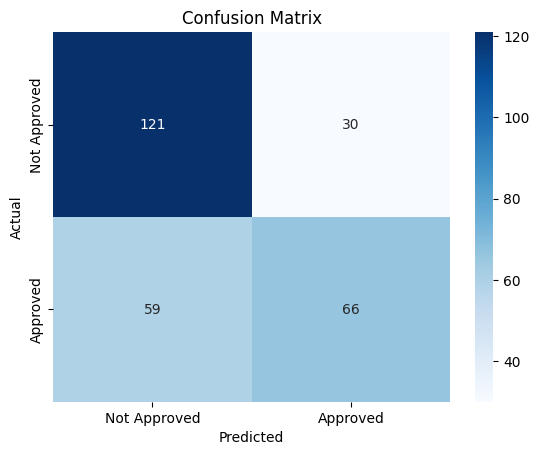

In [ ]:
from sklearn.metrics import confusion_matrix

# Recalculate the confusion matrix (assuming y_test and y_pred are available from previous cells)
cm = confusion_matrix(y_test, y_pred)

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Approved', 'Approved'], yticklabels=['Not Approved', 'Approved'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

**DECISION TREE**

In [ ]:
from sklearn.tree import DecisionTreeClassifier
model_dt = DecisionTreeClassifier(random_state=42)
model_dt.fit(X_train, y_train)
y_pred_dt = model_dt.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

print("Accuracy:", accuracy_score(y_test, y_pred_dt))
print("\nClassification Report:\n", classification_report(y_test, y_pred_dt))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_dt))

Accuracy: 0.7898550724637681

Classification Report:
               precision    recall  f1-score   support

           0       0.80      0.81      0.81       151
           1       0.77      0.76      0.77       125

    accuracy                           0.79       276
   macro avg       0.79      0.79      0.79       276
weighted avg       0.79      0.79      0.79       276


Confusion Matrix:
 [[123  28]
 [ 30  95]]


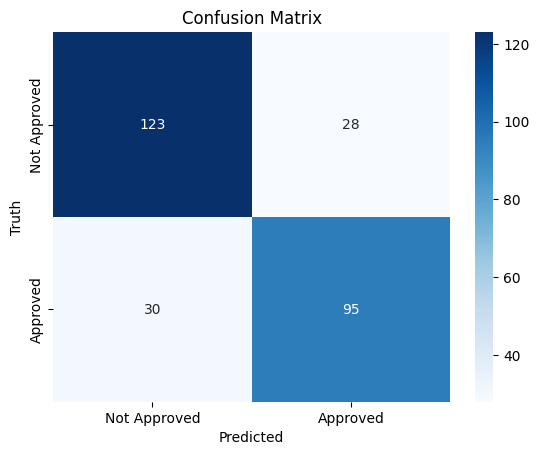

In [ ]:
from sklearn.metrics import confusion_matrix
cm_dt = confusion_matrix(y_test,y_pred_dt)
sns.heatmap(cm_dt, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

---------------------------------------

**svc**

In [ ]:
from sklearn import svm
model_svm=svm.SVC(class_weight='balanced',kernel='rbf',gamma = "scale")
model_svm.fit(X_train,y_train)
y_pred_svm=model_svm.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
print(accuracy_score(y_test,y_pred_svm))
print(classification_report(y_test,y_pred_svm))
print(confusion_matrix(y_test,y_pred_svm))

0.6123188405797102
              precision    recall  f1-score   support

           0       0.64      0.66      0.65       151
           1       0.57      0.55      0.56       125

    accuracy                           0.61       276
   macro avg       0.61      0.61      0.61       276
weighted avg       0.61      0.61      0.61       276

[[100  51]
 [ 56  69]]


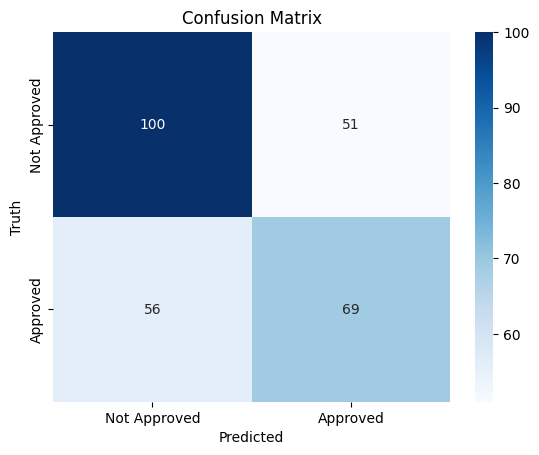

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm_svm = confusion_matrix(y_test, y_pred_svm)
sns.heatmap(cm_svm, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

**random forest**

In [ ]:
from sklearn.ensemble import RandomForestClassifier
model_rf=RandomForestClassifier()
model_rf.fit(X_train,y_train)
y_pred_rf=model_rf.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

print("Accuracy:", accuracy_score(y_test, y_pred_rf))
print("\nClassification Report:\n", classification_report(y_test, y_pred_rf))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_rf))

Accuracy: 0.8586956521739131

Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.87      0.87       151
           1       0.85      0.84      0.84       125

    accuracy                           0.86       276
   macro avg       0.86      0.86      0.86       276
weighted avg       0.86      0.86      0.86       276


Confusion Matrix:
 [[132  19]
 [ 20 105]]


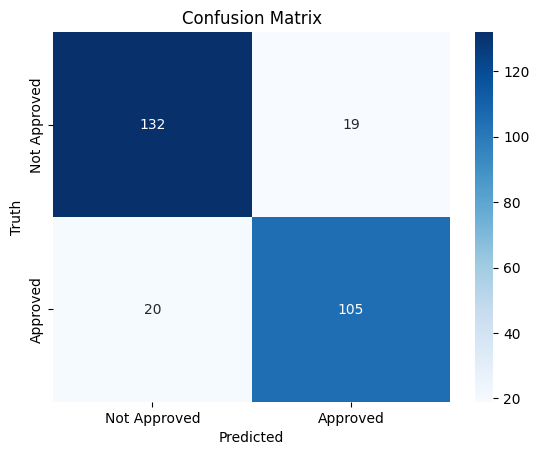

In [ ]:
from sklearn.metrics import confusion_matrix
cm_rf = confusion_matrix(y_test,y_pred_rf)
cm_rf
sns.heatmap(cm_rf, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

**Bagging**

In [ ]:
from sklearn.ensemble import BaggingClassifier
BGG = BaggingClassifier()
BGG.fit(X_train, y_train)
y_pred_bgg = BGG.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

print("Accuracy:", accuracy_score(y_test, y_pred_bgg))
print("\nClassification Report:\n", classification_report(y_test, y_pred_bgg))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_bgg))

Accuracy: 0.8369565217391305

Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.87      0.85       151
           1       0.83      0.80      0.82       125

    accuracy                           0.84       276
   macro avg       0.84      0.83      0.83       276
weighted avg       0.84      0.84      0.84       276


Confusion Matrix:
 [[131  20]
 [ 25 100]]


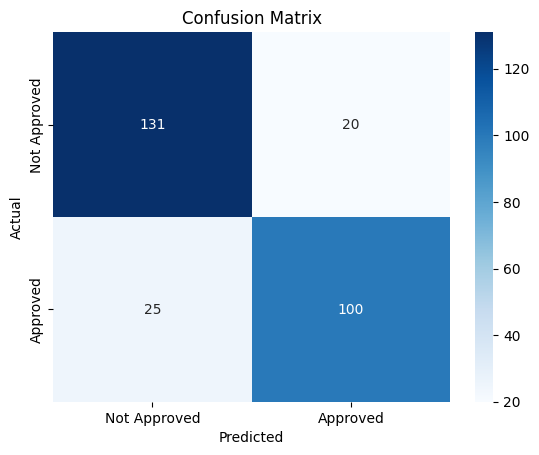

In [ ]:
from sklearn.metrics import confusion_matrix
cm_bgg= confusion_matrix(y_test,y_pred_bgg)
sns.heatmap(cm_bgg, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
model_ada = AdaBoostClassifier()
model_ada.fit(X_train, y_train)
y_pred_ada = model_ada.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

print("Accuracy:", accuracy_score(y_test, y_pred_ada))
print("\nClassification Report:\n", classification_report(y_test, y_pred_ada))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_ada))

Accuracy: 0.8586956521739131

Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.84      0.87       151
           1       0.82      0.88      0.85       125

    accuracy                           0.86       276
   macro avg       0.86      0.86      0.86       276
weighted avg       0.86      0.86      0.86       276


Confusion Matrix:
 [[127  24]
 [ 15 110]]


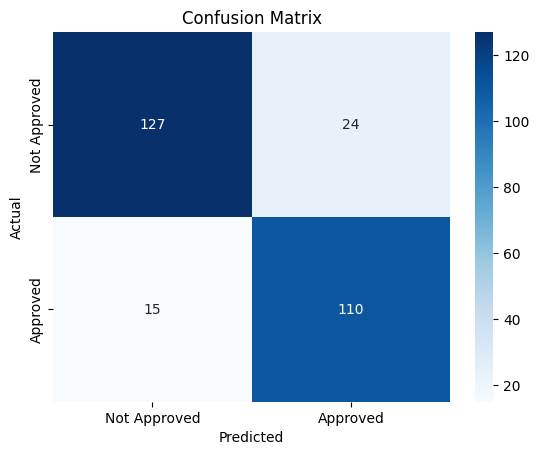

In [ ]:
from sklearn.metrics import confusion_matrix
cm_ada = confusion_matrix(y_test,y_pred_ada)
sns.heatmap(cm_ada, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [ ]:
base_estimator = RandomForestClassifier(max_depth=12, random_state=42)
br = AdaBoostClassifier(estimator=base_estimator, n_estimators=100, learning_rate=0.05)

br = br.fit(X_train,y_train)
y_pred_br = br.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
print(accuracy_score(y_test,y_pred_br))
print(classification_report(y_test,y_pred_br))
print(confusion_matrix(y_test,y_pred_br))

0.8586956521739131
              precision    recall  f1-score   support

           0       0.89      0.85      0.87       151
           1       0.83      0.87      0.85       125

    accuracy                           0.86       276
   macro avg       0.86      0.86      0.86       276
weighted avg       0.86      0.86      0.86       276

[[128  23]
 [ 16 109]]


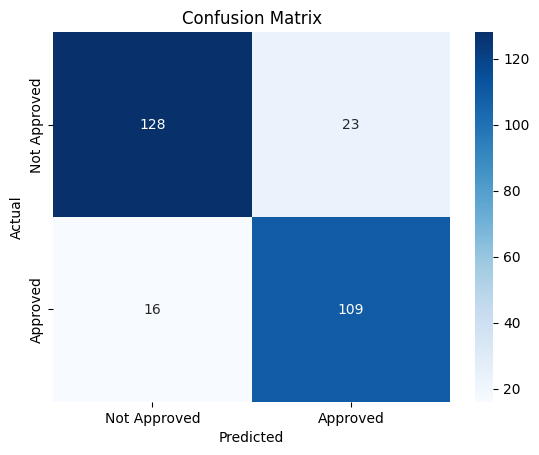

In [ ]:
from sklearn.metrics import confusion_matrix
cm_br = confusion_matrix(y_test,y_pred_br)
sns.heatmap(cm_br, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
model_gb=GradientBoostingClassifier()
model_gb.fit(X_train,y_train)
y_pred_gb=model_gb.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
print(accuracy_score(y_test,y_pred_gb))
print(classification_report(y_test,y_pred_gb))
print(confusion_matrix(y_test,y_pred_gb))

0.855072463768116
              precision    recall  f1-score   support

           0       0.89      0.84      0.86       151
           1       0.82      0.87      0.84       125

    accuracy                           0.86       276
   macro avg       0.85      0.86      0.85       276
weighted avg       0.86      0.86      0.86       276

[[127  24]
 [ 16 109]]


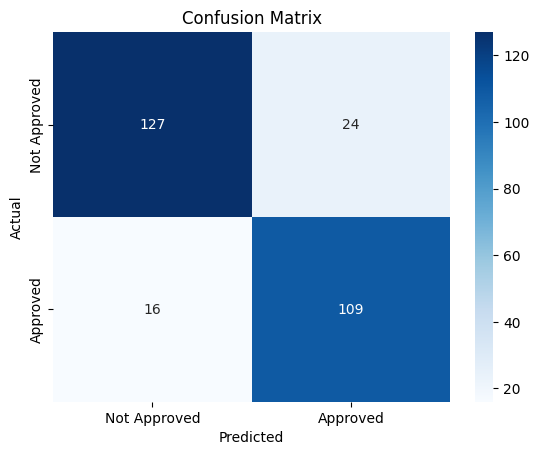

In [ ]:
from sklearn.metrics import confusion_matrix
cm_gb = confusion_matrix(y_test,y_pred_gb)
sns.heatmap(cm_gb, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [ ]:
from xgboost import XGBClassifier
model_xgb=XGBClassifier()
model_xgb.fit(X_train,y_train)
y_pred_xgb=model_xgb.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
print(accuracy_score(y_test,y_pred_xgb))
print(classification_report(y_test,y_pred_xgb))
print(confusion_matrix(y_test,y_pred_xgb))

0.855072463768116
              precision    recall  f1-score   support

           0       0.88      0.85      0.86       151
           1       0.82      0.86      0.84       125

    accuracy                           0.86       276
   macro avg       0.85      0.86      0.85       276
weighted avg       0.86      0.86      0.86       276

[[128  23]
 [ 17 108]]


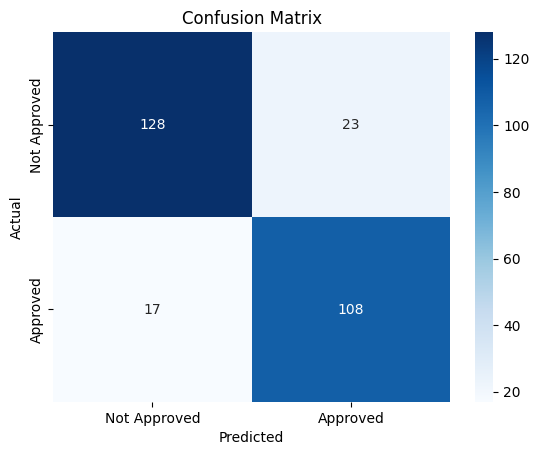

In [ ]:
from sklearn.metrics import confusion_matrix
cm_xgb = confusion_matrix(y_test,y_pred_xgb)
sns.heatmap(cm_xgb, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# 75-25

In [ ]:
X = data.drop('Approved', axis=1)
y = data['Approved']



In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)


In [ ]:
# Model training
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)


LogisticRegression(max_iter=1000)

In [ ]:
y_pred = model.predict(X_test)
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))


Confusion Matrix:
 [[76 15]
 [14 68]]

Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.84      0.84        91
           1       0.82      0.83      0.82        82

    accuracy                           0.83       173
   macro avg       0.83      0.83      0.83       173
weighted avg       0.83      0.83      0.83       173



In [ ]:
# Cross-validation
cv_scores = cross_val_score(model, X, y, cv=5)
print("Cross-Validation Accuracy Scores:", cv_scores)
print("Mean Cross-Validation Accuracy:", cv_scores.mean())


Cross-Validation Accuracy Scores: [0.63043478 0.96376812 0.9057971  0.79710145 0.91304348]
Mean Cross-Validation Accuracy: 0.8420289855072463


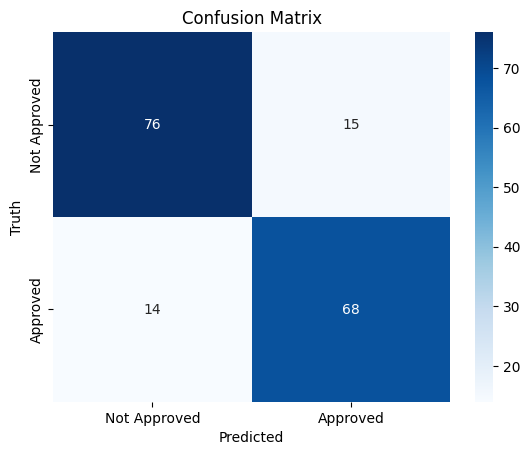

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
# Train the KNN model
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [ ]:
y_pred = knn.predict(X_test)


In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))


Accuracy: 0.6589595375722543


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))


[[73 18]
 [41 41]]
              precision    recall  f1-score   support

           0       0.64      0.80      0.71        91
           1       0.69      0.50      0.58        82

    accuracy                           0.66       173
   macro avg       0.67      0.65      0.65       173
weighted avg       0.67      0.66      0.65       173



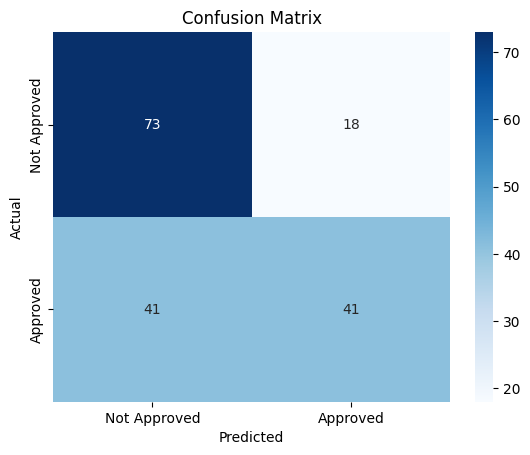

In [ ]:
from sklearn.metrics import confusion_matrix

# Recalculate the confusion matrix (assuming y_test and y_pred are available from previous cells)
cm = confusion_matrix(y_test, y_pred)

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Approved', 'Approved'], yticklabels=['Not Approved', 'Approved'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

**DECISION TREE**

In [ ]:
from sklearn.tree import DecisionTreeClassifier
model_dt = DecisionTreeClassifier(random_state=42)
model_dt.fit(X_train, y_train)
y_pred_dt = model_dt.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

print("Accuracy:", accuracy_score(y_test, y_pred_dt))
print("\nClassification Report:\n", classification_report(y_test, y_pred_dt))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_dt))

Accuracy: 0.7745664739884393

Classification Report:
               precision    recall  f1-score   support

           0       0.76      0.84      0.80        91
           1       0.79      0.71      0.75        82

    accuracy                           0.77       173
   macro avg       0.78      0.77      0.77       173
weighted avg       0.78      0.77      0.77       173


Confusion Matrix:
 [[76 15]
 [24 58]]


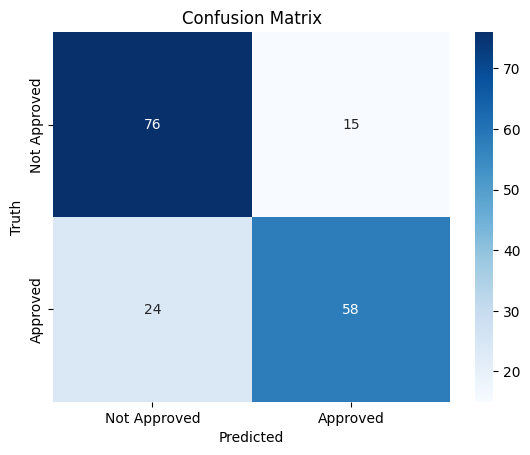

In [ ]:
from sklearn.metrics import confusion_matrix
cm_dt = confusion_matrix(y_test,y_pred_dt)
sns.heatmap(cm_dt, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

**svc**

In [ ]:
from sklearn import svm
model_svm=svm.SVC(class_weight='balanced',kernel='rbf',gamma = "scale")
model_svm.fit(X_train,y_train)
y_pred_svm=model_svm.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
print(accuracy_score(y_test,y_pred_svm))
print(classification_report(y_test,y_pred_svm))
print(confusion_matrix(y_test,y_pred_svm))

0.6127167630057804
              precision    recall  f1-score   support

           0       0.62      0.67      0.65        91
           1       0.60      0.55      0.57        82

    accuracy                           0.61       173
   macro avg       0.61      0.61      0.61       173
weighted avg       0.61      0.61      0.61       173

[[61 30]
 [37 45]]


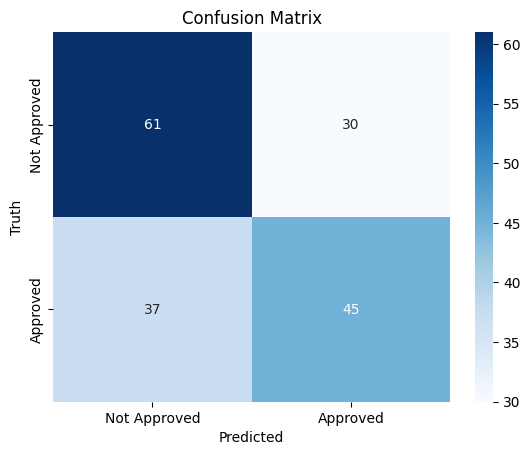

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm_svm = confusion_matrix(y_test, y_pred_svm)
sns.heatmap(cm_svm, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

**random forest**

In [ ]:
from sklearn.ensemble import RandomForestClassifier
model_rf=RandomForestClassifier()
model_rf.fit(X_train,y_train)
y_pred_rf=model_rf.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

print("Accuracy:", accuracy_score(y_test, y_pred_rf))
print("\nClassification Report:\n", classification_report(y_test, y_pred_rf))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_rf))

Accuracy: 0.8670520231213873

Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.91      0.88        91
           1       0.89      0.82      0.85        82

    accuracy                           0.87       173
   macro avg       0.87      0.86      0.87       173
weighted avg       0.87      0.87      0.87       173


Confusion Matrix:
 [[83  8]
 [15 67]]


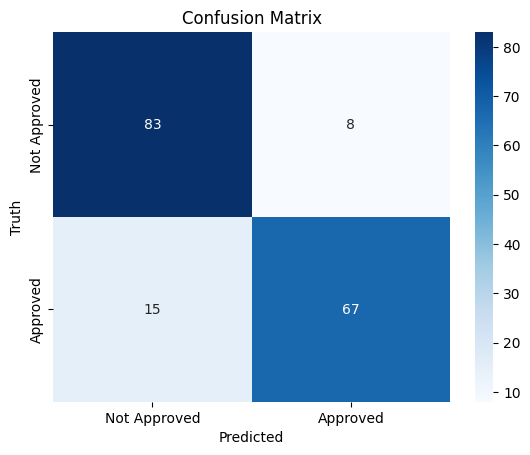

In [ ]:
from sklearn.metrics import confusion_matrix
cm_rf = confusion_matrix(y_test,y_pred_rf)
cm_rf
sns.heatmap(cm_rf, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

**Bagging**

In [ ]:
from sklearn.ensemble import BaggingClassifier
BGG = BaggingClassifier()
BGG.fit(X_train, y_train)
y_pred_bgg = BGG.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

print("Accuracy:", accuracy_score(y_test, y_pred_bgg))
print("\nClassification Report:\n", classification_report(y_test, y_pred_bgg))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_bgg))

Accuracy: 0.8265895953757225

Classification Report:
               precision    recall  f1-score   support

           0       0.80      0.89      0.84        91
           1       0.86      0.76      0.81        82

    accuracy                           0.83       173
   macro avg       0.83      0.82      0.82       173
weighted avg       0.83      0.83      0.83       173


Confusion Matrix:
 [[81 10]
 [20 62]]


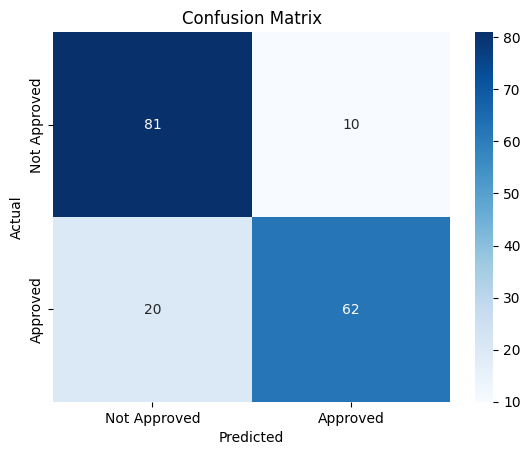

In [ ]:
from sklearn.metrics import confusion_matrix
cm_bgg= confusion_matrix(y_test,y_pred_bgg)
sns.heatmap(cm_bgg, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
model_ada = AdaBoostClassifier()
model_ada.fit(X_train, y_train)
y_pred_ada = model_ada.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

print("Accuracy:", accuracy_score(y_test, y_pred_ada))
print("\nClassification Report:\n", classification_report(y_test, y_pred_ada))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_ada))

Accuracy: 0.8323699421965318

Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.82      0.84        91
           1       0.81      0.84      0.83        82

    accuracy                           0.83       173
   macro avg       0.83      0.83      0.83       173
weighted avg       0.83      0.83      0.83       173


Confusion Matrix:
 [[75 16]
 [13 69]]


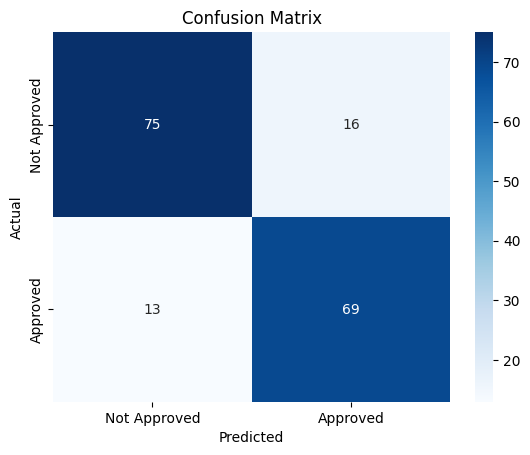

In [ ]:
from sklearn.metrics import confusion_matrix
cm_ada = confusion_matrix(y_test,y_pred_ada)
sns.heatmap(cm_ada, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [ ]:
base_estimator = RandomForestClassifier(max_depth=12, random_state=42)
br = AdaBoostClassifier(estimator=base_estimator, n_estimators=100, learning_rate=0.05)

br = br.fit(X_train,y_train)
y_pred_br = br.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
print(accuracy_score(y_test,y_pred_br))
print(classification_report(y_test,y_pred_br))
print(confusion_matrix(y_test,y_pred_br))

0.861271676300578
              precision    recall  f1-score   support

           0       0.83      0.92      0.88        91
           1       0.90      0.79      0.84        82

    accuracy                           0.86       173
   macro avg       0.87      0.86      0.86       173
weighted avg       0.87      0.86      0.86       173

[[84  7]
 [17 65]]


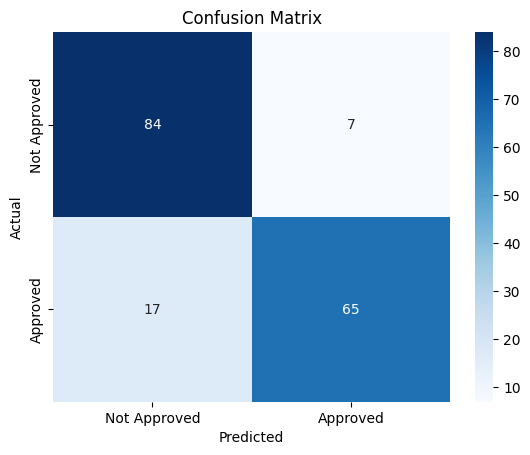

In [ ]:
from sklearn.metrics import confusion_matrix
cm_br = confusion_matrix(y_test,y_pred_br)
sns.heatmap(cm_br, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
model_gb=GradientBoostingClassifier()
model_gb.fit(X_train,y_train)
y_pred_gb=model_gb.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
print(accuracy_score(y_test,y_pred_gb))
print(classification_report(y_test,y_pred_gb))
print(confusion_matrix(y_test,y_pred_gb))

0.8323699421965318
              precision    recall  f1-score   support

           0       0.84      0.84      0.84        91
           1       0.82      0.83      0.82        82

    accuracy                           0.83       173
   macro avg       0.83      0.83      0.83       173
weighted avg       0.83      0.83      0.83       173

[[76 15]
 [14 68]]


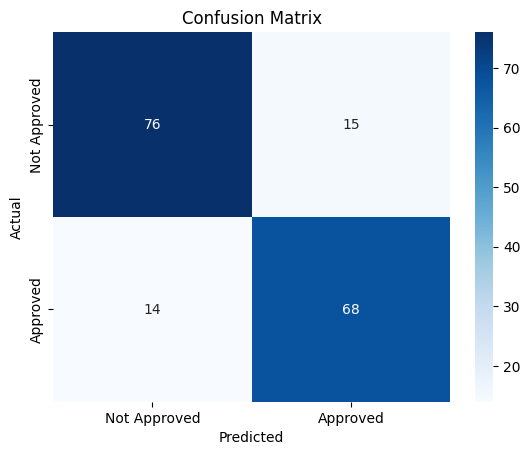

In [ ]:
from sklearn.metrics import confusion_matrix
cm_gb = confusion_matrix(y_test,y_pred_gb)
sns.heatmap(cm_gb, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [ ]:
from xgboost import XGBClassifier
model_xgb=XGBClassifier()
model_xgb.fit(X_train,y_train)
y_pred_xgb=model_xgb.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
print(accuracy_score(y_test,y_pred_xgb))
print(classification_report(y_test,y_pred_xgb))
print(confusion_matrix(y_test,y_pred_xgb))

0.8670520231213873
              precision    recall  f1-score   support

           0       0.84      0.92      0.88        91
           1       0.90      0.80      0.85        82

    accuracy                           0.87       173
   macro avg       0.87      0.86      0.87       173
weighted avg       0.87      0.87      0.87       173

[[84  7]
 [16 66]]


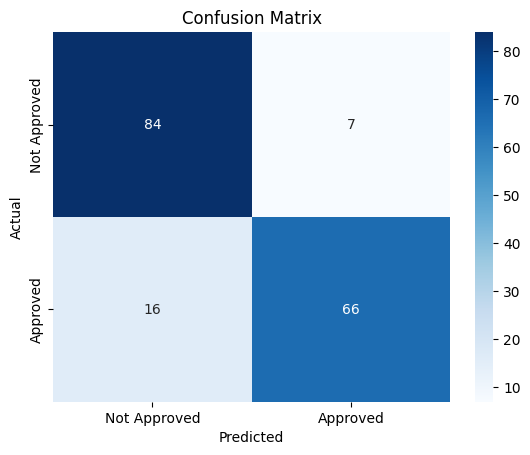

In [ ]:
from sklearn.metrics import confusion_matrix
cm_xgb = confusion_matrix(y_test,y_pred_xgb)
sns.heatmap(cm_xgb, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# 80-20

In [ ]:
X = data.drop('Approved', axis=1)
y = data['Approved']



In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [ ]:
# Model training
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)


LogisticRegression(max_iter=1000)

In [ ]:
y_pred = model.predict(X_test)
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))


Confusion Matrix:
 [[56 12]
 [13 57]]

Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.82      0.82        68
           1       0.83      0.81      0.82        70

    accuracy                           0.82       138
   macro avg       0.82      0.82      0.82       138
weighted avg       0.82      0.82      0.82       138



In [ ]:
accuracy = accuracy_score(y_test, y_pred)
accuracy


0.8188405797101449

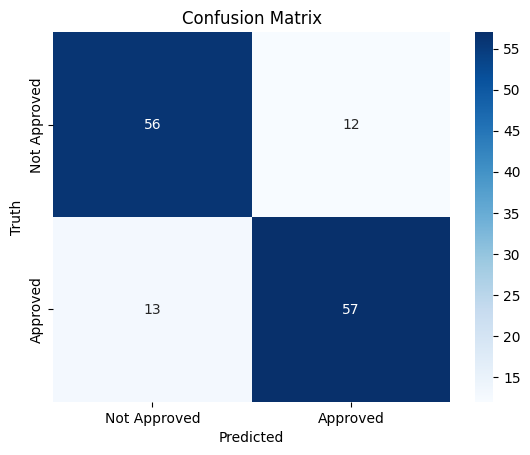

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
# Train the KNN model
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [ ]:
y_pred = knn.predict(X_test)


In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))


Accuracy: 0.644927536231884


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))


[[55 13]
 [36 34]]
              precision    recall  f1-score   support

           0       0.60      0.81      0.69        68
           1       0.72      0.49      0.58        70

    accuracy                           0.64       138
   macro avg       0.66      0.65      0.64       138
weighted avg       0.66      0.64      0.64       138



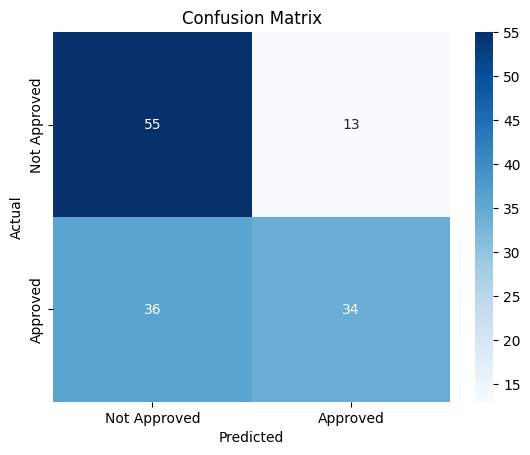

In [ ]:
from sklearn.metrics import confusion_matrix

# Recalculate the confusion matrix (assuming y_test and y_pred are available from previous cells)
cm = confusion_matrix(y_test, y_pred)

sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Approved', 'Approved'], yticklabels=['Not Approved', 'Approved'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

**DECISION TREE**

In [ ]:
from sklearn.tree import DecisionTreeClassifier
model_dt = DecisionTreeClassifier(random_state=42)
model_dt.fit(X_train, y_train)
y_pred_dt = model_dt.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

print("Accuracy:", accuracy_score(y_test, y_pred_dt))
print("\nClassification Report:\n", classification_report(y_test, y_pred_dt))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_dt))

Accuracy: 0.7536231884057971

Classification Report:
               precision    recall  f1-score   support

           0       0.76      0.74      0.75        68
           1       0.75      0.77      0.76        70

    accuracy                           0.75       138
   macro avg       0.75      0.75      0.75       138
weighted avg       0.75      0.75      0.75       138


Confusion Matrix:
 [[50 18]
 [16 54]]


In [ ]:
accuracy = accuracy_score(y_test, y_pred_dt)
accuracy

0.7536231884057971

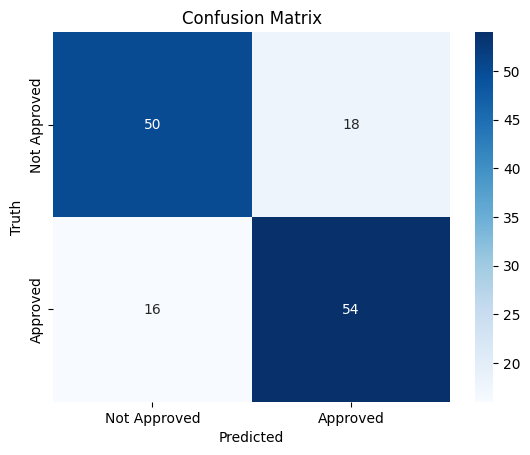

In [ ]:
from sklearn.metrics import confusion_matrix
cm_dt = confusion_matrix(y_test,y_pred_dt)
sns.heatmap(cm_dt, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

**svc**

In [ ]:
from sklearn import svm
model_svm=svm.SVC(class_weight='balanced',kernel='rbf',gamma = "scale")
model_svm.fit(X_train,y_train)
y_pred_svm=model_svm.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
print(accuracy_score(y_test,y_pred_svm))
print(classification_report(y_test,y_pred_svm))
print(confusion_matrix(y_test,y_pred_svm))

0.6159420289855072
              precision    recall  f1-score   support

           0       0.59      0.69      0.64        68
           1       0.64      0.54      0.59        70

    accuracy                           0.62       138
   macro avg       0.62      0.62      0.61       138
weighted avg       0.62      0.62      0.61       138

[[47 21]
 [32 38]]


In [ ]:
accuracy = accuracy_score(y_test, y_pred_svm)
accuracy

0.6159420289855072

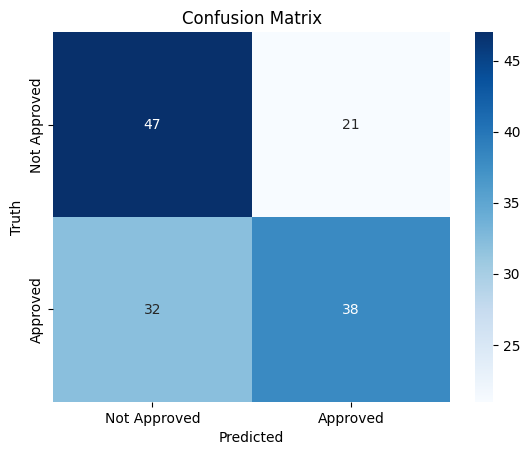

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm_svm = confusion_matrix(y_test, y_pred_svm)
sns.heatmap(cm_svm, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

**random forest**

In [ ]:
from sklearn.ensemble import RandomForestClassifier
model_rf=RandomForestClassifier()
model_rf.fit(X_train,y_train)
y_pred_rf=model_rf.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

print("Accuracy:", accuracy_score(y_test, y_pred_rf))
print("\nClassification Report:\n", classification_report(y_test, y_pred_rf))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_rf))

Accuracy: 0.855072463768116

Classification Report:
               precision    recall  f1-score   support

           0       0.82      0.91      0.86        68
           1       0.90      0.80      0.85        70

    accuracy                           0.86       138
   macro avg       0.86      0.86      0.85       138
weighted avg       0.86      0.86      0.85       138


Confusion Matrix:
 [[62  6]
 [14 56]]


In [ ]:
accuracy = accuracy_score(y_test, y_pred_rf)
accuracy

0.855072463768116

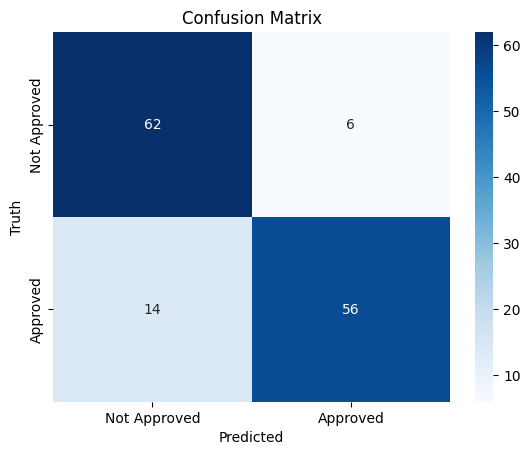

In [ ]:
from sklearn.metrics import confusion_matrix
cm_rf = confusion_matrix(y_test,y_pred_rf)
cm_rf
sns.heatmap(cm_rf, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

**Bagging**

In [ ]:
from sklearn.ensemble import BaggingClassifier
BGG = BaggingClassifier()
BGG.fit(X_train, y_train)
y_pred_bgg = BGG.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

print("Accuracy:", accuracy_score(y_test, y_pred_bgg))
print("\nClassification Report:\n", classification_report(y_test, y_pred_bgg))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_bgg))

Accuracy: 0.8260869565217391

Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.88      0.83        68
           1       0.87      0.77      0.82        70

    accuracy                           0.83       138
   macro avg       0.83      0.83      0.83       138
weighted avg       0.83      0.83      0.83       138


Confusion Matrix:
 [[60  8]
 [16 54]]


In [ ]:
accuracy = accuracy_score(y_test, y_pred_bgg)
accuracy

0.8260869565217391

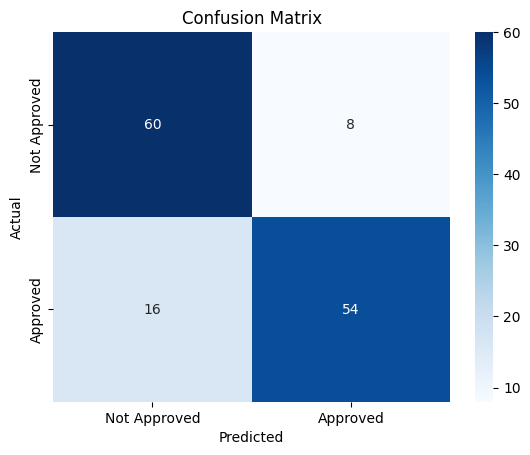

In [ ]:
from sklearn.metrics import confusion_matrix
cm_bgg= confusion_matrix(y_test,y_pred_bgg)
sns.heatmap(cm_bgg, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
model_ada = AdaBoostClassifier()
model_ada.fit(X_train, y_train)
y_pred_ada = model_ada.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

print("Accuracy:", accuracy_score(y_test, y_pred_ada))
print("\nClassification Report:\n", classification_report(y_test, y_pred_ada))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_ada))

Accuracy: 0.8188405797101449

Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.82      0.82        68
           1       0.83      0.81      0.82        70

    accuracy                           0.82       138
   macro avg       0.82      0.82      0.82       138
weighted avg       0.82      0.82      0.82       138


Confusion Matrix:
 [[56 12]
 [13 57]]


In [ ]:
accuracy = accuracy_score(y_test, y_pred_ada)
accuracy

0.8188405797101449

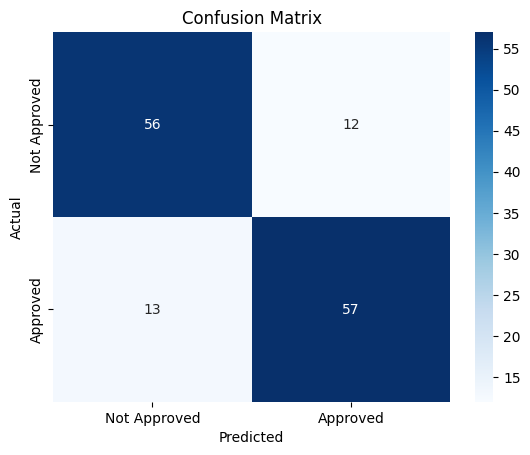

In [ ]:
from sklearn.metrics import confusion_matrix
cm_ada = confusion_matrix(y_test,y_pred_ada)
sns.heatmap(cm_ada, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [ ]:
base_estimator = RandomForestClassifier(max_depth=12, random_state=42)
br = AdaBoostClassifier(estimator=base_estimator, n_estimators=100, learning_rate=0.05)

br = br.fit(X_train,y_train)
y_pred_br = br.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
print(accuracy_score(y_test,y_pred_br))
print(classification_report(y_test,y_pred_br))
print(confusion_matrix(y_test,y_pred_br))

0.855072463768116
              precision    recall  f1-score   support

           0       0.83      0.88      0.86        68
           1       0.88      0.83      0.85        70

    accuracy                           0.86       138
   macro avg       0.86      0.86      0.86       138
weighted avg       0.86      0.86      0.86       138

[[60  8]
 [12 58]]


In [ ]:
accuracy = accuracy_score(y_test, y_pred_br)
accuracy

0.855072463768116

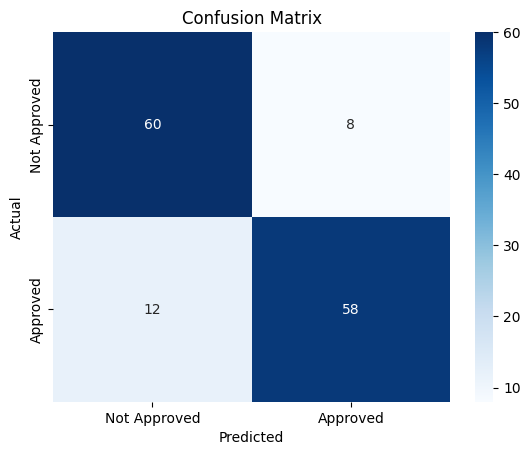

In [ ]:
from sklearn.metrics import confusion_matrix
cm_br = confusion_matrix(y_test,y_pred_br)
sns.heatmap(cm_br, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
model_gb=GradientBoostingClassifier()
model_gb.fit(X_train,y_train)
y_pred_gb=model_gb.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
print(accuracy_score(y_test,y_pred_gb))
print(classification_report(y_test,y_pred_gb))
print(confusion_matrix(y_test,y_pred_gb))

0.8695652173913043
              precision    recall  f1-score   support

           0       0.84      0.91      0.87        68
           1       0.91      0.83      0.87        70

    accuracy                           0.87       138
   macro avg       0.87      0.87      0.87       138
weighted avg       0.87      0.87      0.87       138

[[62  6]
 [12 58]]


In [ ]:
accuracy = accuracy_score(y_test, y_pred_gb)
accuracy

0.8695652173913043

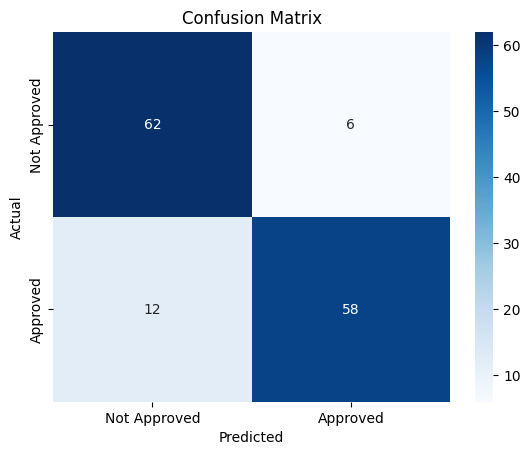

In [ ]:
from sklearn.metrics import confusion_matrix
cm_gb = confusion_matrix(y_test,y_pred_gb)
sns.heatmap(cm_gb, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [ ]:
from xgboost import XGBClassifier
model_xgb=XGBClassifier()
model_xgb.fit(X_train,y_train)
y_pred_xgb=model_xgb.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
print(accuracy_score(y_test,y_pred_xgb))
print(classification_report(y_test,y_pred_xgb))
print(confusion_matrix(y_test,y_pred_xgb))

0.8333333333333334
              precision    recall  f1-score   support

           0       0.80      0.88      0.84        68
           1       0.87      0.79      0.83        70

    accuracy                           0.83       138
   macro avg       0.84      0.83      0.83       138
weighted avg       0.84      0.83      0.83       138

[[60  8]
 [15 55]]


In [ ]:
accuaracy = accuracy_score(y_test, y_pred_xgb)
accuaracy

0.8333333333333334

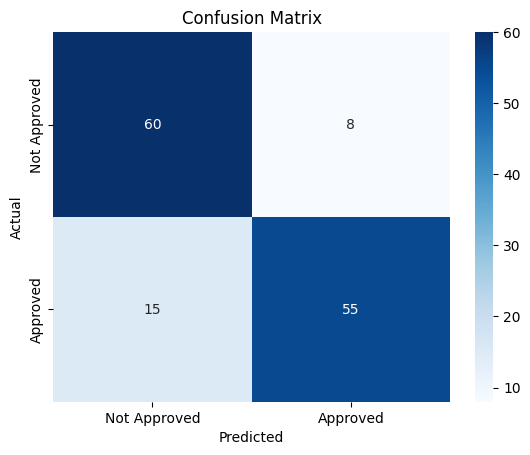

In [ ]:
from sklearn.metrics import confusion_matrix
cm_xgb = confusion_matrix(y_test,y_pred_xgb)
sns.heatmap(cm_xgb, annot=True, fmt="d", cmap="Blues", xticklabels=["Not Approved", "Approved"], yticklabels=["Not Approved", "Approved"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

>>>>>>>>>>>>

# ANN

In [ ]:
#ann
import tensorflow as tf
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
from sklearn.model_selection import train_test_split
x_train1, x_test1, y_train1, y_test1 = train_test_split(x, y, test_size=0.40, random_state=42)
x_train2, x_test2, y_train2, y_test2 = train_test_split(x, y, test_size=0.30, random_state=42)
x_train3, x_test3, y_train3, y_test3 = train_test_split(x, y, test_size=0.25, random_state=42)
x_train4 ,x_test4, y_train4, y_test4 = train_test_split(x, y, test_size=0.20, random_state=42)
x_train ,x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=42)

# Adam

# 60-40

In [ ]:
import tensorflow as tf
tf.random.set_seed(42)

# Model 1 : 60-40 Split
model1 = tf.keras.Sequential([
    tf.keras.layers.Dense(24, activation='relu', input_shape=(x_train1.shape[1],)),
    tf.keras.layers.Dense(20, activation='relu'),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # sigmoid for binary classification
])

model1.compile(
        loss=tf.keras.losses.BinaryCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
        metrics=[
            tf.keras.metrics.BinaryAccuracy(name="accuracy"),
            tf.keras.metrics.Precision(name="precision"),
            tf.keras.metrics.Recall(name="recall"),
            tf.keras.metrics.AUC(name="auc")
        ]
)

history1 = model1.fit(x_train1, y_train1, epochs=100, verbose=1, #100,200,400
                      validation_data=(x_test1, y_test1))


Epoch 1/100


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step - accuracy: 0.3771 - auc: 0.3907 - loss: 4.2786 - precision: 0.3784 - recall: 0.5727 - val_accuracy: 0.5543 - val_auc: 0.6085 - val_loss: 1.1896 - val_precision: 0.6667 - val_recall: 0.0320
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.5208 - auc: 0.5569 - loss: 1.0287 - precision: 0.3867 - recall: 0.1514 - val_accuracy: 0.4312 - val_auc: 0.4116 - val_loss: 0.7713 - val_precision: 0.4279 - val_recall: 0.7600
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.5269 - auc: 0.5192 - loss: 0.7456 - precision: 0.4969 - recall: 0.2662 - val_accuracy: 0.5471 - val_auc: 0.5504 - val_loss: 0.6898 - val_precision: 0.5000 - val_recall: 0.5760
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.5188 - auc: 0.5284 - loss: 0.6949 - precision: 0.4819 - recall: 0.5992 - val_accuracy: 0.6087 - val_auc: 0.6445 - val_loss: 0.6727 - val_precision: 0.8400 - val_recall: 0.1680
Epoch 5/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/s

In [ ]:
print(" Model 1 (60-40 Split)")
print(model1.evaluate(x_test1, y_test1, verbose=1))
print()

 Model 1 (60-40 Split)
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8409 - auc: 0.8808 - loss: 0.5657 - precision: 0.8488 - recall: 0.7919 
[0.485069215297699, 0.8514492511749268, 0.8387096524238586, 0.8320000171661377, 0.8979867100715637]



In [ ]:
import tensorflow as tf
tf.random.set_seed(42)

# Model 1 : 60-40 Split
model1 = tf.keras.Sequential([
    tf.keras.layers.Dense(24, activation='relu', input_shape=(x_train1.shape[1],)),
    tf.keras.layers.Dense(20, activation='relu'),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # sigmoid for binary classification
])

model1.compile(
        loss=tf.keras.losses.BinaryCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
        metrics=[
            tf.keras.metrics.BinaryAccuracy(name="accuracy"),
            tf.keras.metrics.Precision(name="precision"),
            tf.keras.metrics.Recall(name="recall"),
            tf.keras.metrics.AUC(name="auc")
        ]
)

history1 = model1.fit(x_train1, y_train1, epochs=200, verbose=1, #100,200,300
                      validation_data=(x_test1, y_test1))


Epoch 1/200


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 5s 132ms/step - accuracy: 0.6075 - auc: 0.6118 - loss: 7.1838 - precision: 0.8265 - recall: 0.1778 - val_accuracy: 0.4457 - val_auc: 0.4270 - val_loss: 1.2182 - val_precision: 0.4462 - val_recall: 0.9280
Epoch 2/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.4635 - auc: 0.4631 - loss: 1.3853 - precision: 0.4524 - recall: 0.8387 - val_accuracy: 0.5978 - val_auc: 0.6395 - val_loss: 1.0538 - val_precision: 0.6522 - val_recall: 0.2400
Epoch 3/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.6226 - auc: 0.6077 - loss: 0.9433 - precision: 0.6866 - recall: 0.4700 - val_accuracy: 0.7029 - val_auc: 0.7457 - val_loss: 0.6314 - val_precision: 0.6937 - val_recall: 0.6160
Epoch 4/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.6814 - auc: 0.6791 - loss: 0.6634 - precision: 0.7201 - recall: 0.4925 - val_accuracy: 0.6413 - val_auc: 0.7704 - val_loss: 0.6430 - val_precision: 0.5739 - val_recall: 0.8080
Epoch 5/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2

In [ ]:
print(" Model 1 (60-40 Split)")
print(model1.evaluate(x_test1, y_test1, verbose=1))
print()

 Model 1 (60-40 Split)
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8105 - auc: 0.8764 - loss: 0.6335 - precision: 0.7848 - recall: 0.8031 
[0.5665439963340759, 0.8224637508392334, 0.779411792755127, 0.8479999899864197, 0.8887681365013123]



In [ ]:
import tensorflow as tf
tf.random.set_seed(42)

# Model 1 : 60-40 Split
model1 = tf.keras.Sequential([
    tf.keras.layers.Dense(24, activation='relu', input_shape=(x_train1.shape[1],)),
    tf.keras.layers.Dense(20, activation='relu'),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # sigmoid for binary classification
])

model1.compile(
        loss=tf.keras.losses.BinaryCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
        metrics=[
            tf.keras.metrics.BinaryAccuracy(name="accuracy"),
            tf.keras.metrics.Precision(name="precision"),
            tf.keras.metrics.Recall(name="recall"),
            tf.keras.metrics.AUC(name="auc")
        ]
)

history1 = model1.fit(x_train1, y_train1, epochs=400, verbose=1, #100,200,300
                      validation_data=(x_test1, y_test1))


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/400
13/13 ━━━━━━━━━━━━━━━━━━━━ 5s 78ms/step - accuracy: 0.4566 - auc: 0.3774 - loss: 5.6190 - precision: 0.4566 - recall: 1.0000 - val_accuracy: 0.4529 - val_auc: 0.4086 - val_loss: 2.4138 - val_precision: 0.4529 - val_recall: 1.0000
Epoch 2/400
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.4696 - auc: 0.4603 - loss: 1.5793 - precision: 0.4574 - recall: 0.9074 - val_accuracy: 0.6087 - val_auc: 0.6068 - val_loss: 0.6708 - val_precision: 0.6604 - val_recall: 0.2800
Epoch 3/400
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.6324 - auc: 0.5754 - loss: 0.6871 - precision: 0.6957 - recall: 0.3321 - val_accuracy: 0.6051 - val_auc: 0.6114 - val_loss: 0.6779 - val_precision: 0.6739 - val_recall: 0.2480
Epoch 4/400
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.6372 - auc: 0.5800 - loss: 0.6793 - precision: 0.7106 - recall: 0.3333 - val_accuracy: 0.6087 - val_auc: 0.5874 - val_loss: 0.6629 - val_precision: 0.6809 - val_recall: 0.2560
Epoch 5/400
13/13 ━━━━━━━━━━━━━━

In [ ]:
print(" Model 1 (60-40 Split)")
print(model1.evaluate(x_test1, y_test1, verbose=1))
print()

 Model 1 (60-40 Split)
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7880 - auc: 0.8529 - loss: 0.7706 - precision: 0.7457 - recall: 0.8103 
[0.8471660614013672, 0.79347825050354, 0.7428571581840515, 0.8320000171661377, 0.8477880358695984]



# 70-30

In [ ]:
# Model 2 : 70-30 Split
model2 = tf.keras.Sequential([
    tf.keras.layers.Dense(24, activation='relu', input_shape=(x_train2.shape[1],)),
    tf.keras.layers.Dense(20, activation='relu'),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # sigmoid for binary classification
])

model2.compile(
    loss=tf.keras.losses.BinaryCrossentropy(),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[
        tf.keras.metrics.BinaryAccuracy(name="accuracy"),
        tf.keras.metrics.Precision(name="precision"),
        tf.keras.metrics.Recall(name="recall"),
        tf.keras.metrics.AUC(name="auc")
    ]
)

history2 = model2.fit(
    x_train2, y_train2,
    epochs=100,
    verbose=1,
    validation_data=(x_test2, y_test2)  # add validation for performance tracking
)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.5872 - auc: 0.5878 - loss: 2.5840 - precision: 0.5625 - recall: 0.0844 - val_accuracy: 0.6087 - val_auc: 0.6197 - val_loss: 0.7007 - val_precision: 0.6739 - val_recall: 0.3196
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.4830 - auc: 0.4829 - loss: 0.8416 - precision: 0.4476 - recall: 0.7587 - val_accuracy: 0.6280 - val_auc: 0.6385 - val_loss: 0.6667 - val_precision: 0.6220 - val_recall: 0.5258
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6540 - auc: 0.6236 - loss: 0.6691 - precision: 0.6250 - recall: 0.4633 - val_accuracy: 0.5942 - val_auc: 0.6571 - val_loss: 0.6603 - val_precision: 0.5619 - val_recall: 0.6082
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5155 - auc: 0.6241 - loss: 0.6945 - precision: 0.4646 - recall: 0.8596 - val_accuracy: 0.6618 - val_auc: 0.6608 - val_loss: 0.6532 - val_precision: 0.7077 - val_recall: 0.4742
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━

In [ ]:
print(" Model 2 (70-30 Split)")
print(model2.evaluate(x_test2, y_test2, verbose=1))
print()

 Model 2 (70-30 Split)
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.8229 - auc: 0.8687 - loss: 0.5450 - precision: 0.7925 - recall: 0.8334 
[0.5172412991523743, 0.8357487916946411, 0.7943925261497498, 0.876288652420044, 0.8781161904335022]



In [ ]:
# Model 2 : 70-30 Split
model2 = tf.keras.Sequential([
    tf.keras.layers.Dense(24, activation='relu', input_shape=(x_train2.shape[1],)),
    tf.keras.layers.Dense(20, activation='relu'),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # sigmoid for binary classification
])

model2.compile(
    loss=tf.keras.losses.BinaryCrossentropy(),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[
        tf.keras.metrics.BinaryAccuracy(name="accuracy"),
        tf.keras.metrics.Precision(name="precision"),
        tf.keras.metrics.Recall(name="recall"),
        tf.keras.metrics.AUC(name="auc")
    ]
)

history2 = model2.fit(
    x_train2, y_train2,
    epochs=200,
    verbose=1,
    validation_data=(x_test2, y_test2)  # add validation for performance tracking
)


Epoch 1/200


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 4s 99ms/step - accuracy: 0.5414 - auc: 0.5372 - loss: 1.2082 - precision: 0.4605 - recall: 0.3302 - val_accuracy: 0.5797 - val_auc: 0.5715 - val_loss: 0.7290 - val_precision: 0.6562 - val_recall: 0.2165
Epoch 2/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - accuracy: 0.5504 - auc: 0.5544 - loss: 0.6895 - precision: 0.4683 - recall: 0.3912 - val_accuracy: 0.5797 - val_auc: 0.5789 - val_loss: 0.6735 - val_precision: 0.6136 - val_recall: 0.2784
Epoch 3/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.5135 - auc: 0.5694 - loss: 0.6917 - precision: 0.4561 - recall: 0.6369 - val_accuracy: 0.5894 - val_auc: 0.6034 - val_loss: 0.6667 - val_precision: 0.6667 - val_recall: 0.2474
Epoch 4/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.5351 - auc: 0.6019 - loss: 0.6811 - precision: 0.4766 - recall: 0.6601 - val_accuracy: 0.6087 - val_auc: 0.6611 - val_loss: 0.6477 - val_precision: 0.7105 - val_recall: 0.2784
Epoch 5/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 7m

In [ ]:
print(" Model 2 (70-30 Split)")
print(model2.evaluate(x_test2, y_test2, verbose=1))
print()

 Model 2 (70-30 Split)
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8412 - auc: 0.8811 - loss: 0.4871 - precision: 0.8285 - recall: 0.8302 
[0.5198331475257874, 0.8405796885490417, 0.807692289352417, 0.8659793734550476, 0.8877225518226624]



In [ ]:
# Model 2 : 70-30 Split
model2 = tf.keras.Sequential([
    tf.keras.layers.Dense(24, activation='relu', input_shape=(x_train2.shape[1],)),
    tf.keras.layers.Dense(20, activation='relu'),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # sigmoid for binary classification
])

model2.compile(
    loss=tf.keras.losses.BinaryCrossentropy(),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[
        tf.keras.metrics.BinaryAccuracy(name="accuracy"),
        tf.keras.metrics.Precision(name="precision"),
        tf.keras.metrics.Recall(name="recall"),
        tf.keras.metrics.AUC(name="auc")
    ]
)

history2 = model2.fit(
    x_train2, y_train2,
    epochs=350,
    verbose=1,
    validation_data=(x_test2, y_test2)  # add validation for performance tracking
)


Epoch 1/350


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - accuracy: 0.5733 - auc: 0.5736 - loss: 1.9057 - precision: 0.3796 - recall: 0.0537 - val_accuracy: 0.4444 - val_auc: 0.3870 - val_loss: 0.7076 - val_precision: 0.4489 - val_recall: 0.8144
Epoch 2/350
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.4373 - auc: 0.4370 - loss: 0.7465 - precision: 0.4145 - recall: 0.7983 - val_accuracy: 0.5652 - val_auc: 0.5983 - val_loss: 0.6965 - val_precision: 0.6061 - val_recall: 0.2062
Epoch 3/350
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6001 - auc: 0.5844 - loss: 0.6785 - precision: 0.5468 - recall: 0.3686 - val_accuracy: 0.5845 - val_auc: 0.6217 - val_loss: 0.6809 - val_precision: 0.5965 - val_recall: 0.3505
Epoch 4/350
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6051 - auc: 0.6341 - loss: 0.6850 - precision: 0.5335 - recall: 0.6378 - val_accuracy: 0.5942 - val_auc: 0.6308 - val_loss: 0.6707 - val_precision: 0.6667 - val_recall: 0.2680
Epoch 5/350
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/s

In [ ]:
print(" Model 2 (70-30 Split)")
print(model2.evaluate(x_test2, y_test2, verbose=1))
print()

 Model 2 (70-30 Split)
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.8140 - auc: 0.8886 - loss: 0.7112 - precision: 0.8145 - recall: 0.7781
[0.7041987776756287, 0.8164251446723938, 0.8041236996650696, 0.8041236996650696, 0.8947984576225281]



# 75-25

In [ ]:
# Model 3 : 75-25 Split
model3 = tf.keras.Sequential([
    tf.keras.layers.Dense(24, activation='relu', input_shape=(x_train3.shape[1],)),
    tf.keras.layers.Dense(20, activation='relu'),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # sigmoid for binary classification
])

model3.compile(
    loss=tf.keras.losses.BinaryCrossentropy(),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[
        tf.keras.metrics.BinaryAccuracy(name="accuracy"),
        tf.keras.metrics.Precision(name="precision"),
        tf.keras.metrics.Recall(name="recall"),
        tf.keras.metrics.AUC(name="auc")
    ]
)

history3 = model3.fit(
    x_train3, y_train3,
    epochs=100,
    verbose=1,
    validation_data=(x_test3, y_test3)  # validation for test performance
)


Epoch 1/100


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - accuracy: 0.4451 - auc: 0.4153 - loss: 5.1198 - precision: 0.4275 - recall: 0.8628 - val_accuracy: 0.5896 - val_auc: 0.6190 - val_loss: 1.4926 - val_precision: 0.6897 - val_recall: 0.2439
Epoch 2/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5810 - auc: 0.5806 - loss: 0.9849 - precision: 0.5570 - recall: 0.4705 - val_accuracy: 0.6127 - val_auc: 0.6294 - val_loss: 0.7192 - val_precision: 0.7419 - val_recall: 0.2805
Epoch 3/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6279 - auc: 0.6114 - loss: 0.6699 - precision: 0.6308 - recall: 0.3432 - val_accuracy: 0.5434 - val_auc: 0.6433 - val_loss: 0.6688 - val_precision: 0.5109 - val_recall: 0.8537
Epoch 4/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5813 - auc: 0.6538 - loss: 0.6491 - precision: 0.5150 - recall: 0.6328 - val_accuracy: 0.4855 - val_auc: 0.5575 - val_loss: 0.9582 - val_precision: 0.4793 - val_recall: 0.9878
Epoch 5/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/s

In [ ]:
print(" Model 3 (75-25 Split)")
print(model3.evaluate(x_test3, y_test3, verbose=1))
print()

 Model 3 (75-25 Split)
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.7795 - auc: 0.8497 - loss: 0.6058 - precision: 0.7244 - recall: 0.8405 
[0.5716880559921265, 0.7919074892997742, 0.7300000190734863, 0.8902438879013062, 0.870008111000061]



In [ ]:
# Model 3 : 75-25 Split
model3 = tf.keras.Sequential([
    tf.keras.layers.Dense(24, activation='relu', input_shape=(x_train3.shape[1],)),
    tf.keras.layers.Dense(20, activation='relu'),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # sigmoid for binary classification
])

model3.compile(
    loss=tf.keras.losses.BinaryCrossentropy(),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[
        tf.keras.metrics.BinaryAccuracy(name="accuracy"),
        tf.keras.metrics.Precision(name="precision"),
        tf.keras.metrics.Recall(name="recall"),
        tf.keras.metrics.AUC(name="auc")
    ]
)

history3 = model3.fit(
    x_train3, y_train3,
    epochs=250,
    verbose=1,
    validation_data=(x_test3, y_test3)  # validation for test performance
)


Epoch 1/250


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - accuracy: 0.6284 - auc: 0.5987 - loss: 9.6024 - precision: 0.6673 - recall: 0.2781 - val_accuracy: 0.6301 - val_auc: 0.6411 - val_loss: 0.8719 - val_precision: 0.7647 - val_recall: 0.3171
Epoch 2/250
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.5070 - auc: 0.4780 - loss: 1.2792 - precision: 0.4799 - recall: 0.7975 - val_accuracy: 0.6185 - val_auc: 0.6508 - val_loss: 0.8484 - val_precision: 0.7353 - val_recall: 0.3049
Epoch 3/250
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.6107 - auc: 0.6472 - loss: 0.7029 - precision: 0.5683 - recall: 0.5215 - val_accuracy: 0.5087 - val_auc: 0.6293 - val_loss: 0.7151 - val_precision: 0.4908 - val_recall: 0.9756
Epoch 4/250
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5923 - auc: 0.7022 - loss: 0.6868 - precision: 0.5242 - recall: 0.7767 - val_accuracy: 0.4913 - val_auc: 0.4994 - val_loss: 1.0414 - val_precision: 0.4819 - val_recall: 0.9756
Epoch 5/250
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/s

In [ ]:
print(" Model 3 (75-25 Split)")
print(model3.evaluate(x_test3, y_test3, verbose=1))
print()

 Model 3 (75-25 Split)
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8078 - auc: 0.8674 - loss: 0.6889 - precision: 0.7806 - recall: 0.8099 
[0.6059678792953491, 0.8208092451095581, 0.800000011920929, 0.8292682766914368, 0.8811310529708862]



In [ ]:
# Model 3 : 75-25 Split
model3 = tf.keras.Sequential([
    tf.keras.layers.Dense(24, activation='relu', input_shape=(x_train3.shape[1],)),
    tf.keras.layers.Dense(20, activation='relu'),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # sigmoid for binary classification
])

model3.compile(
    loss=tf.keras.losses.BinaryCrossentropy(),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[
        tf.keras.metrics.BinaryAccuracy(name="accuracy"),
        tf.keras.metrics.Precision(name="precision"),
        tf.keras.metrics.Recall(name="recall"),
        tf.keras.metrics.AUC(name="auc")
    ]
)

history3 = model3.fit(
    x_train3, y_train3,
    epochs=350,
    verbose=1,
    validation_data=(x_test3, y_test3)  # validation for test performance
)


Epoch 1/350


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 6s 114ms/step - accuracy: 0.4350 - auc: 0.4025 - loss: 7.0649 - precision: 0.4312 - recall: 0.9761 - val_accuracy: 0.6012 - val_auc: 0.6390 - val_loss: 1.1489 - val_precision: 0.6970 - val_recall: 0.2805
Epoch 2/350
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.6328 - auc: 0.6312 - loss: 0.9813 - precision: 0.6374 - recall: 0.3570 - val_accuracy: 0.4798 - val_auc: 0.4820 - val_loss: 1.0559 - val_precision: 0.4767 - val_recall: 1.0000
Epoch 3/350
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4804 - auc: 0.5646 - loss: 0.8948 - precision: 0.4451 - recall: 0.8266 - val_accuracy: 0.6358 - val_auc: 0.7212 - val_loss: 0.6213 - val_precision: 0.7317 - val_recall: 0.3659
Epoch 4/350
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.5825 - auc: 0.6468 - loss: 0.6727 - precision: 0.5373 - recall: 0.6818 - val_accuracy: 0.7110 - val_auc: 0.7834 - val_loss: 0.6166 - val_precision: 0.7000 - val_recall: 0.6829
Epoch 5/350
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 2

In [ ]:
print(" Model 3 (75-25 Split)")
print(model3.evaluate(x_test3, y_test3, verbose=1))
print()

 Model 3 (75-25 Split)
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.8525 - auc: 0.8666 - loss: 0.7827 - precision: 0.8617 - recall: 0.8127 
[0.7567207217216492, 0.8554913401603699, 0.8607594966888428, 0.8292682766914368, 0.8784508109092712]



# 80-20

In [ ]:
# Model 4 : 80-20 Split
model4 = tf.keras.Sequential([
    tf.keras.layers.Dense(24, activation='relu', input_shape=(x_train4.shape[1],)),
    tf.keras.layers.Dense(20, activation='relu'),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # sigmoid for binary classification
])

model4.compile(
    loss=tf.keras.losses.BinaryCrossentropy(),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[
        tf.keras.metrics.BinaryAccuracy(name="accuracy"),
        tf.keras.metrics.Precision(name="precision"),
        tf.keras.metrics.Recall(name="recall"),
        tf.keras.metrics.AUC(name="auc")
    ]
)

history4 = model4.fit(
    x_train4, y_train4,
    epochs=150,
    verbose=1,
    validation_data=(x_test4, y_test4)  # validation to check generalization
)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/150
18/18 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - accuracy: 0.4302 - auc: 0.4553 - loss: 7.1927 - precision: 0.4302 - recall: 1.0000 - val_accuracy: 0.5145 - val_auc: 0.3982 - val_loss: 1.3892 - val_precision: 0.5109 - val_recall: 1.0000
Epoch 2/150
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.5300 - auc: 0.5381 - loss: 0.9201 - precision: 0.4758 - recall: 0.6988 - val_accuracy: 0.5507 - val_auc: 0.5972 - val_loss: 0.6811 - val_precision: 0.5408 - val_recall: 0.7571
Epoch 3/150
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5854 - auc: 0.6429 - loss: 0.6637 - precision: 0.5224 - recall: 0.5764 - val_accuracy: 0.6014 - val_auc: 0.6734 - val_loss: 0.7000 - val_precision: 0.7143 - val_recall: 0.3571
Epoch 4/150
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6138 - auc: 0.6502 - loss: 0.6645 - precision: 0.5606 - recall: 0.4616 - val_accuracy: 0.5797 - val_auc: 0.6688 - val_loss: 0.7682 - val_precision: 0.7000 - val_recall: 0.3000
Epoch 5/150
18/18 ━━━━━━━━━━━━━━━━━

In [ ]:
print(" Model 4 (80-20 Split)")
print(model4.evaluate(x_test4, y_test4, verbose=1))
print()

 Model 4 (80-20 Split)
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.8618 - auc: 0.8875 - loss: 0.5019 - precision: 0.8959 - recall: 0.8057
[0.48895585536956787, 0.8550724387168884, 0.8787878751754761, 0.8285714387893677, 0.8986344337463379]



In [ ]:
# Model 4 : 80-20 Split
model4 = tf.keras.Sequential([
    tf.keras.layers.Dense(24, activation='relu', input_shape=(x_train4.shape[1],)),
    tf.keras.layers.Dense(20, activation='relu'),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # sigmoid for binary classification
])

model4.compile(
    loss=tf.keras.losses.BinaryCrossentropy(),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[
        tf.keras.metrics.BinaryAccuracy(name="accuracy"),
        tf.keras.metrics.Precision(name="precision"),
        tf.keras.metrics.Recall(name="recall"),
        tf.keras.metrics.AUC(name="auc")
    ]
)

history4 = model4.fit(
    x_train4, y_train4,
    epochs=250,
    verbose=1,
    validation_data=(x_test4, y_test4)  # validation to check generalization
)


Epoch 1/250


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step - accuracy: 0.4845 - auc: 0.4689 - loss: 0.7573 - precision: 0.4226 - recall: 0.4263 - val_accuracy: 0.5580 - val_auc: 0.6097 - val_loss: 0.7499 - val_precision: 0.7647 - val_recall: 0.1857
Epoch 2/250
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5692 - auc: 0.5255 - loss: 0.7158 - precision: 0.5096 - recall: 0.2670 - val_accuracy: 0.5797 - val_auc: 0.6238 - val_loss: 0.7828 - val_precision: 0.8750 - val_recall: 0.2000
Epoch 3/250
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.5982 - auc: 0.5412 - loss: 0.7401 - precision: 0.5949 - recall: 0.3188 - val_accuracy: 0.5797 - val_auc: 0.6321 - val_loss: 0.7600 - val_precision: 0.8750 - val_recall: 0.2000
Epoch 4/250
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6079 - auc: 0.5537 - loss: 0.7317 - precision: 0.6032 - recall: 0.3204 - val_accuracy: 0.5870 - val_auc: 0.6394 - val_loss: 0.7341 - val_precision: 0.8421 - val_recall: 0.2286
Epoch 5/250
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/

In [ ]:
print(" Model 4 (80-20 Split)")
print(model4.evaluate(x_test4, y_test4, verbose=1))
print()

 Model 4 (80-20 Split)
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8468 - auc: 0.8686 - loss: 0.5633 - precision: 0.9029 - recall: 0.7625 
[0.5451825857162476, 0.8333333134651184, 0.8852459192276001, 0.7714285850524902, 0.8857142925262451]



In [ ]:
# Model 4 : 80-20 Split
model4 = tf.keras.Sequential([
    tf.keras.layers.Dense(24, activation='relu', input_shape=(x_train4.shape[1],)),
    tf.keras.layers.Dense(20, activation='relu'),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # sigmoid for binary classification
])

model4.compile(
    loss=tf.keras.losses.BinaryCrossentropy(),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[
        tf.keras.metrics.BinaryAccuracy(name="accuracy"),
        tf.keras.metrics.Precision(name="precision"),
        tf.keras.metrics.Recall(name="recall"),
        tf.keras.metrics.AUC(name="auc")
    ]
)

history4 = model4.fit(
    x_train4, y_train4,
    epochs=350,
    verbose=1,
    validation_data=(x_test4, y_test4)  # validation to check generalization
)


Epoch 1/350


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - accuracy: 0.4580 - auc: 0.4211 - loss: 0.9915 - precision: 0.3737 - recall: 0.3377 - val_accuracy: 0.5507 - val_auc: 0.6081 - val_loss: 1.0858 - val_precision: 0.9000 - val_recall: 0.1286
Epoch 2/350
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.5580 - auc: 0.4935 - loss: 0.8823 - precision: 0.5261 - recall: 0.4023 - val_accuracy: 0.6087 - val_auc: 0.6196 - val_loss: 0.8949 - val_precision: 0.9444 - val_recall: 0.2429
Epoch 3/350
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5446 - auc: 0.5338 - loss: 0.7756 - precision: 0.5027 - recall: 0.4582 - val_accuracy: 0.6232 - val_auc: 0.6288 - val_loss: 0.7084 - val_precision: 0.9091 - val_recall: 0.2857
Epoch 4/350
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5717 - auc: 0.5545 - loss: 0.6951 - precision: 0.5223 - recall: 0.4259 - val_accuracy: 0.6232 - val_auc: 0.6567 - val_loss: 0.6985 - val_precision: 0.9091 - val_recall: 0.2857
Epoch 5/350
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11

In [ ]:
print(" Model 4 (80-20 Split)")
print(model4.evaluate(x_test4, y_test4, verbose=1))
print()

 Model 4 (80-20 Split)
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.8396 - auc: 0.8663 - loss: 0.9475 - precision: 0.8893 - recall: 0.7600 
[0.8120492696762085, 0.8260869383811951, 0.8709677457809448, 0.7714285850524902, 0.8825629949569702]



In [ ]:
# Model 7 : Deeper ANN (Classification)(80-20)
model7 = tf.keras.Sequential([
    tf.keras.layers.Dense(24, activation='relu', input_shape=(x_train.shape[1],)),
    tf.keras.layers.Dense(20, activation='relu'),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dense(5, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # sigmoid for binary classification
])

model7.compile(
    loss=tf.keras.losses.BinaryCrossentropy(),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[
        tf.keras.metrics.BinaryAccuracy(name="accuracy"),
        tf.keras.metrics.Precision(name="precision"),
        tf.keras.metrics.Recall(name="recall"),
        tf.keras.metrics.AUC(name="auc")
    ]
)

history7 = model7.fit(
    x_train, y_train,
    epochs=250,  # deeper net, longer training
    verbose=1,
    validation_data=(x_test, y_test)  # track test performance
)


Epoch 1/250


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - accuracy: 0.4739 - auc: 0.5049 - loss: 0.8321 - precision: 0.4356 - recall: 0.7358 - val_accuracy: 0.5290 - val_auc: 0.5488 - val_loss: 0.6921 - val_precision: 0.6471 - val_recall: 0.1571
Epoch 2/250
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6093 - auc: 0.5543 - loss: 0.6906 - precision: 0.6509 - recall: 0.2052 - val_accuracy: 0.5507 - val_auc: 0.5672 - val_loss: 0.6899 - val_precision: 0.7500 - val_recall: 0.1714
Epoch 3/250
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.6177 - auc: 0.5983 - loss: 0.6876 - precision: 0.6671 - recall: 0.2175 - val_accuracy: 0.5580 - val_auc: 0.5771 - val_loss: 0.6848 - val_precision: 0.7647 - val_recall: 0.1857
Epoch 4/250
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.6331 - auc: 0.5876 - loss: 0.6824 - precision: 0.7076 - recall: 0.2493 - val_accuracy: 0.5797 - val_auc: 0.6231 - val_loss: 0.6771 - val_precision: 0.8333 - val_recall: 0.2143
Epoch 5/250
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 19

In [ ]:
print(" Model 7 (Deeper ANN)")
print(model7.evaluate(x_test, y_test, verbose=1))
print()

 Model 7 (Deeper ANN)
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7653 - auc: 0.8851 - loss: 0.8010 - precision: 0.9260 - recall: 0.5486
[0.7666758894920349, 0.7463768124580383, 0.9069767594337463, 0.5571428537368774, 0.8869747519493103]



In [ ]:
# Model 7 : Deeper ANN (Classification)(80-20)
model7 = tf.keras.Sequential([
    tf.keras.layers.Dense(24, activation='relu', input_shape=(x_train.shape[1],)),
    tf.keras.layers.Dense(20, activation='relu'),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dense(5, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # sigmoid for binary classification
])

model7.compile(
    loss=tf.keras.losses.BinaryCrossentropy(),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[
        tf.keras.metrics.BinaryAccuracy(name="accuracy"),
        tf.keras.metrics.Precision(name="precision"),
        tf.keras.metrics.Recall(name="recall"),
        tf.keras.metrics.AUC(name="auc")
    ]
)

history7 = model7.fit(
    x_train, y_train,
    epochs=350,  # deeper net, longer training
    verbose=1,
    validation_data=(x_test, y_test)  # track test performance
)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/350
18/18 ━━━━━━━━━━━━━━━━━━━━ 14s 527ms/step - accuracy: 0.4305 - auc: 0.4416 - loss: 5.6758 - precision: 0.4303 - recall: 1.0000 - val_accuracy: 0.5145 - val_auc: 0.3976 - val_loss: 2.7571 - val_precision: 0.5109 - val_recall: 1.0000
Epoch 2/350
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4562 - auc: 0.4841 - loss: 2.0337 - precision: 0.4418 - recall: 0.9986 - val_accuracy: 0.5362 - val_auc: 0.3961 - val_loss: 1.2913 - val_precision: 0.5224 - val_recall: 1.0000
Epoch 3/350
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4557 - auc: 0.5004 - loss: 1.1002 - precision: 0.4402 - recall: 0.9692 - val_accuracy: 0.5362 - val_auc: 0.4233 - val_loss: 0.9747 - val_precision: 0.5231 - val_recall: 0.9714
Epoch 4/350
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.4706 - auc: 0.5423 - loss: 0.8635 - precision: 0.4473 - recall: 0.9631 - val_accuracy: 0.5217 - val_auc: 0.4791 - val_loss: 0.8063 - val_precision: 0.5156 - val_recall: 0.9429
Epoch 5/350
18/18 ━━━━━━━━━━━━

In [ ]:
print(" Model 7 (Deeper ANN)")
print(model7.evaluate(x_test, y_test, verbose=1))
print()

 Model 7 (Deeper ANN)
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.8039 - auc: 0.8355 - loss: 0.8899 - precision: 0.8160 - recall: 0.7569 
[0.8752566576004028, 0.7971014380455017, 0.8088235259056091, 0.7857142686843872, 0.8523108959197998]



In [ ]:
# Model 7 : Deeper ANN (Classification)(80-20)
model7 = tf.keras.Sequential([
    tf.keras.layers.Dense(24, activation='relu', input_shape=(x_train.shape[1],)),
    tf.keras.layers.Dense(20, activation='relu'),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dense(5, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # sigmoid for binary classification
])

model7.compile(
    loss=tf.keras.losses.BinaryCrossentropy(),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[
        tf.keras.metrics.BinaryAccuracy(name="accuracy"),
        tf.keras.metrics.Precision(name="precision"),
        tf.keras.metrics.Recall(name="recall"),
        tf.keras.metrics.AUC(name="auc")
    ]
)

history7 = model7.fit(
    x_train, y_train,
    epochs=500,  # deeper net, longer training
    verbose=1,
    validation_data=(x_test, y_test)  # track test performance
)


Epoch 1/500


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - accuracy: 0.4302 - auc: 0.4531 - loss: 9.6767 - precision: 0.4302 - recall: 1.0000 - val_accuracy: 0.5290 - val_auc: 0.3785 - val_loss: 5.4613 - val_precision: 0.5185 - val_recall: 1.0000
Epoch 2/500
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.4557 - auc: 0.4561 - loss: 3.6947 - precision: 0.4410 - recall: 0.9891 - val_accuracy: 0.5290 - val_auc: 0.4028 - val_loss: 1.6526 - val_precision: 0.5194 - val_recall: 0.9571
Epoch 3/500
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.4864 - auc: 0.5003 - loss: 1.1523 - precision: 0.4554 - recall: 0.9674 - val_accuracy: 0.4783 - val_auc: 0.5274 - val_loss: 0.6905 - val_precision: 0.4884 - val_recall: 0.6000
Epoch 4/500
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5934 - auc: 0.6164 - loss: 0.6824 - precision: 0.5292 - recall: 0.5399 - val_accuracy: 0.5797 - val_auc: 0.5920 - val_loss: 0.6767 - val_precision: 0.8000 - val_recall: 0.2286
Epoch 5/500
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/s

In [ ]:
print(" Model 7 (Deeper ANN)")
print(model7.evaluate(x_test, y_test, verbose=1))
print()

 Model 7 (Deeper ANN)
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.8364 - auc: 0.8531 - loss: 0.7714 - precision: 0.8869 - recall: 0.7535 
[0.7136428952217102, 0.8333333134651184, 0.8730158805847168, 0.7857142686843872, 0.8727941513061523]



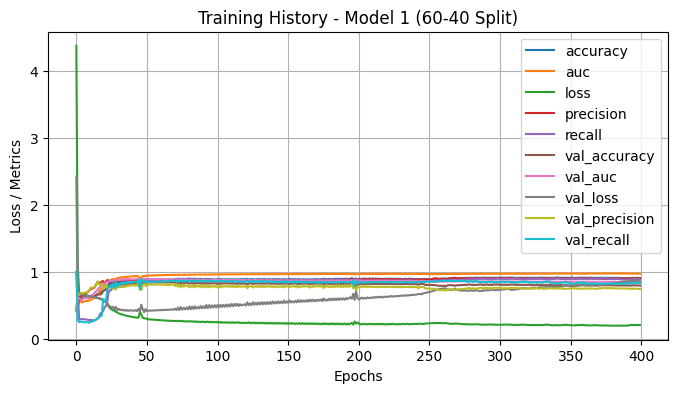

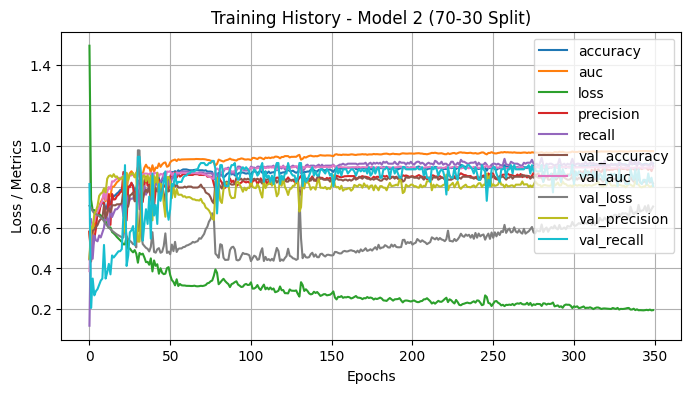

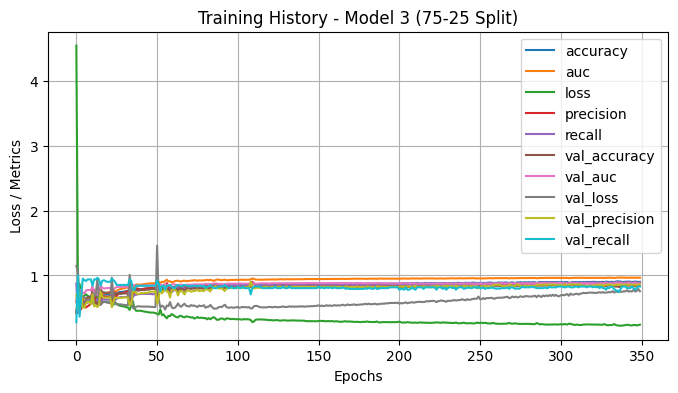

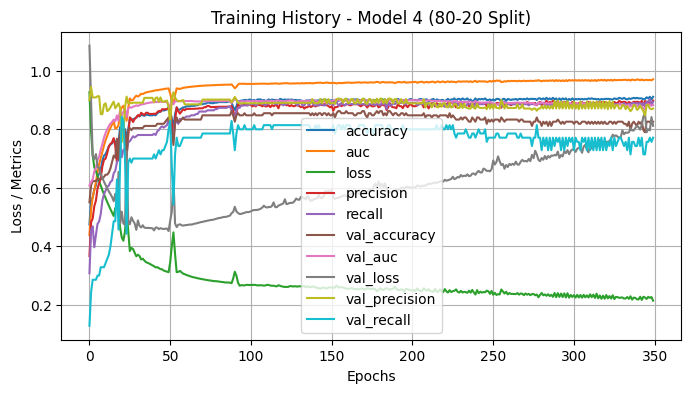

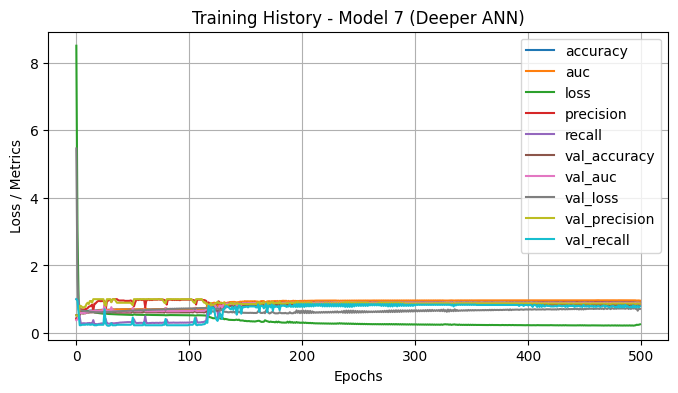

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Store histories in a dictionary
histories = {
    "Model 1 (60-40 Split)": history1,
    "Model 2 (70-30 Split)": history2,
    "Model 3 (75-25 Split)": history3,
    "Model 4 (80-20 Split)": history4,
    "Model 7 (Deeper ANN)": history7
}

# Plot for each model
for name, hist in histories.items():
    plt.figure(figsize=(8,4))
    pd.DataFrame(hist.history).plot(ax=plt.gca())
    plt.title(f"Training History - {name}")
    plt.ylabel("Loss / Metrics")
    plt.xlabel("Epochs")
    plt.grid(True)
    plt.show()


# SGD

# 60-40

In [ ]:
import tensorflow as tf
tf.random.set_seed(42)

# Model 1 : 60-40 Split
model1 = tf.keras.Sequential([
    tf.keras.layers.Dense(24, activation='relu', input_shape=(x_train1.shape[1],)),
    tf.keras.layers.Dense(20, activation='relu'),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # sigmoid for binary classification
])

model1.compile(
        loss=tf.keras.losses.BinaryCrossentropy(),
        optimizer=tf.keras.optimizers.SGD(learning_rate=0.001),
        metrics=[
            tf.keras.metrics.BinaryAccuracy(name="accuracy"),
            tf.keras.metrics.Precision(name="precision"),
            tf.keras.metrics.Recall(name="recall"),
            tf.keras.metrics.AUC(name="auc")
        ]
)

history1 = model1.fit(x_train1, y_train1, epochs=100, verbose=1,
                      validation_data=(x_test1, y_test1))


Epoch 1/100


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.5616 - auc: 0.5136 - loss: 6.5690 - precision: 0.5263 - recall: 0.4586 - val_accuracy: 0.6014 - val_auc: 0.6162 - val_loss: 0.6877 - val_precision: 0.6596 - val_recall: 0.2480
Epoch 2/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6085 - auc: 0.5832 - loss: 0.6818 - precision: 0.6196 - recall: 0.4004 - val_accuracy: 0.6014 - val_auc: 0.6180 - val_loss: 0.7128 - val_precision: 0.6596 - val_recall: 0.2480
Epoch 3/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6085 - auc: 0.5848 - loss: 0.6870 - precision: 0.6196 - recall: 0.4004 - val_accuracy: 0.6014 - val_auc: 0.6178 - val_loss: 0.7113 - val_precision: 0.6596 - val_recall: 0.2480
Epoch 4/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6085 - auc: 0.5861 - loss: 0.6864 - precision: 0.6196 - recall: 0.4004 - val_accuracy: 0.6014 - val_auc: 0.6183 - val_loss: 0.7101 - val_precision: 0.6596 - val_recall: 0.2480
Epoch 5/100
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 9m

In [ ]:
print(" Model 1 (60-40 Split)")
print(model1.evaluate(x_test1, y_test1, verbose=1))
print()

 Model 1 (60-40 Split)
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6050 - auc: 0.6492 - loss: 0.6660 - precision: 0.6759 - recall: 0.2581 
[0.6654906272888184, 0.6123188138008118, 0.6875, 0.2639999985694885, 0.630543053150177]



In [ ]:
import tensorflow as tf
tf.random.set_seed(42)

# Model 1 : 60-40 Split
model1 = tf.keras.Sequential([
    tf.keras.layers.Dense(24, activation='relu', input_shape=(x_train1.shape[1],)),
    tf.keras.layers.Dense(20, activation='relu'),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # sigmoid for binary classification
])

model1.compile(
        loss=tf.keras.losses.BinaryCrossentropy(),
        optimizer=tf.keras.optimizers.SGD(learning_rate=0.001),
        metrics=[
            tf.keras.metrics.BinaryAccuracy(name="accuracy"),
            tf.keras.metrics.Precision(name="precision"),
            tf.keras.metrics.Recall(name="recall"),
            tf.keras.metrics.AUC(name="auc")
        ]
)

history1 = model1.fit(x_train1, y_train1, epochs=200, verbose=1,
                      validation_data=(x_test1, y_test1))


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 3s 108ms/step - accuracy: 0.5242 - auc: 0.5820 - loss: 1.9787 - precision: 0.2940 - recall: 0.1091 - val_accuracy: 0.5616 - val_auc: 0.6510 - val_loss: 0.7115 - val_precision: 1.0000 - val_recall: 0.0320
Epoch 2/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - accuracy: 0.5433 - auc: 0.5875 - loss: 0.7038 - precision: 0.4646 - recall: 0.2984 - val_accuracy: 0.5616 - val_auc: 0.6508 - val_loss: 0.7128 - val_precision: 1.0000 - val_recall: 0.0320
Epoch 3/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - accuracy: 0.5433 - auc: 0.5867 - loss: 0.7035 - precision: 0.4646 - recall: 0.2984 - val_accuracy: 0.5580 - val_auc: 0.6497 - val_loss: 0.7144 - val_precision: 1.0000 - val_recall: 0.0240
Epoch 4/200
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.5460 - auc: 0.5863 - loss: 0.7033 - precision: 0.4694 - recall: 0.2930 - val_accuracy: 0.5580 - val_auc: 0.6502 - val_loss: 0.7158 - val_precision: 1.0000 - val_recall: 0.0240
Epoch 5/200
13/13 ━━━━━━━━━━━━━

In [ ]:
print(" Model 1 (60-40 Split)")
print(model1.evaluate(x_test1, y_test1, verbose=1))
print()

 Model 1 (60-40 Split)
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6008 - auc: 0.6989 - loss: 0.6828 - precision: 0.8169 - recall: 0.1619 
[0.6782928109169006, 0.5978260636329651, 0.7916666865348816, 0.15199999511241913, 0.6837880611419678]



In [ ]:
import tensorflow as tf
tf.random.set_seed(42)

# Model 1 : 60-40 Split
model1 = tf.keras.Sequential([
    tf.keras.layers.Dense(24, activation='relu', input_shape=(x_train1.shape[1],)),
    tf.keras.layers.Dense(20, activation='relu'),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # sigmoid for binary classification
])

model1.compile(
        loss=tf.keras.losses.BinaryCrossentropy(),
        optimizer=tf.keras.optimizers.SGD(learning_rate=0.001),
        metrics=[
            tf.keras.metrics.BinaryAccuracy(name="accuracy"),
            tf.keras.metrics.Precision(name="precision"),
            tf.keras.metrics.Recall(name="recall"),
            tf.keras.metrics.AUC(name="auc")
        ]
)

history1 = model1.fit(x_train1, y_train1, epochs=400, verbose=1,
                      validation_data=(x_test1, y_test1))


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/400
13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 85ms/step - accuracy: 0.4365 - auc: 0.4058 - loss: 5.1299 - precision: 0.4360 - recall: 0.8205 - val_accuracy: 0.5725 - val_auc: 0.5979 - val_loss: 0.6869 - val_precision: 0.5854 - val_recall: 0.1920
Epoch 2/400
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.5718 - auc: 0.5486 - loss: 0.6891 - precision: 0.5827 - recall: 0.2169 - val_accuracy: 0.5761 - val_auc: 0.6088 - val_loss: 0.6798 - val_precision: 0.6053 - val_recall: 0.1840
Epoch 3/400
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.5718 - auc: 0.5602 - loss: 0.6865 - precision: 0.5827 - recall: 0.2169 - val_accuracy: 0.5725 - val_auc: 0.6070 - val_loss: 0.6779 - val_precision: 0.5946 - val_recall: 0.1760
Epoch 4/400
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5718 - auc: 0.5614 - loss: 0.6862 - precision: 0.5827 - recall: 0.2169 - val_accuracy: 0.5725 - val_auc: 0.6079 - val_loss: 0.6776 - val_precision: 0.5946 - val_recall: 0.1760
Epoch 5/400
13/13 ━━━━━━━━━━━━━━

In [ ]:
print(" Model 1 (60-40 Split)")
print(model1.evaluate(x_test1, y_test1, verbose=1))
print()

 Model 1 (60-40 Split)
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6184 - auc: 0.6800 - loss: 0.6638 - precision: 0.7274 - recall: 0.2609 
[0.6610382199287415, 0.6195651888847351, 0.7083333134651184, 0.2720000147819519, 0.6720794439315796]



# 70-30

In [ ]:
# Model 2 : 70-30 Split
model2 = tf.keras.Sequential([
    tf.keras.layers.Dense(24, activation='relu', input_shape=(x_train2.shape[1],)),
    tf.keras.layers.Dense(20, activation='relu'),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # sigmoid for binary classification
])

model2.compile(
    loss=tf.keras.losses.BinaryCrossentropy(),
    optimizer=tf.keras.optimizers.SGD(learning_rate=0.001),
    metrics=[
        tf.keras.metrics.BinaryAccuracy(name="accuracy"),
        tf.keras.metrics.Precision(name="precision"),
        tf.keras.metrics.Recall(name="recall"),
        tf.keras.metrics.AUC(name="auc")
    ]
)

history2 = model2.fit(
    x_train2, y_train2,
    epochs=100, #100,200,350
    verbose=1,
    validation_data=(x_test2, y_test2)  # add validation for performance tracking
)


Epoch 1/100


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - accuracy: 0.5385 - auc: 0.5412 - loss: 1.5270 - precision: 0.4531 - recall: 0.5123 - val_accuracy: 0.4734 - val_auc: 0.4112 - val_loss: 2.0361 - val_precision: 0.4709 - val_recall: 1.0000
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5121 - auc: 0.4935 - loss: 1.5839 - precision: 0.4436 - recall: 0.5835 - val_accuracy: 0.4734 - val_auc: 0.4082 - val_loss: 3.2544 - val_precision: 0.4709 - val_recall: 1.0000
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.5364 - auc: 0.5303 - loss: 1.4461 - precision: 0.4700 - recall: 0.6546 - val_accuracy: 0.4734 - val_auc: 0.4144 - val_loss: 2.3854 - val_precision: 0.4709 - val_recall: 1.0000
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5472 - auc: 0.5474 - loss: 1.2303 - precision: 0.4805 - recall: 0.6518 - val_accuracy: 0.4734 - val_auc: 0.4077 - val_loss: 3.7144 - val_precision: 0.4709 - val_recall: 1.0000
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 20

In [ ]:
print(" Model 2 (70-30 Split)")
print(model2.evaluate(x_test2, y_test2, verbose=1))
print()

 Model 2 (70-30 Split)
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.4675 - auc: 0.3965 - loss: 2.0373 - precision: 0.4639 - recall: 0.9898 
[1.9296053647994995, 0.46859902143478394, 0.4682926833629608, 0.9896907210350037, 0.4309278130531311]



In [ ]:
# Model 2 : 70-30 Split
model2 = tf.keras.Sequential([
    tf.keras.layers.Dense(24, activation='relu', input_shape=(x_train2.shape[1],)),
    tf.keras.layers.Dense(20, activation='relu'),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # sigmoid for binary classification
])

model2.compile(
    loss=tf.keras.losses.BinaryCrossentropy(),
    optimizer=tf.keras.optimizers.SGD(learning_rate=0.001),
    metrics=[
        tf.keras.metrics.BinaryAccuracy(name="accuracy"),
        tf.keras.metrics.Precision(name="precision"),
        tf.keras.metrics.Recall(name="recall"),
        tf.keras.metrics.AUC(name="auc")
    ]
)

history2 = model2.fit(
    x_train2, y_train2,
    epochs=200, #100,200,350
    verbose=1,
    validation_data=(x_test2, y_test2)  # add validation for performance tracking
)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - accuracy: 0.4545 - auc: 0.4773 - loss: 2.4025 - precision: 0.3638 - recall: 0.4049 - val_accuracy: 0.4106 - val_auc: 0.3896 - val_loss: 2.1385 - val_precision: 0.4286 - val_recall: 0.7732
Epoch 2/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.5015 - auc: 0.4352 - loss: 1.2850 - precision: 0.3721 - recall: 0.2862 - val_accuracy: 0.4155 - val_auc: 0.3872 - val_loss: 3.8810 - val_precision: 0.4318 - val_recall: 0.7835
Epoch 3/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.4811 - auc: 0.4695 - loss: 1.5350 - precision: 0.3735 - recall: 0.3545 - val_accuracy: 0.4155 - val_auc: 0.3899 - val_loss: 3.3174 - val_precision: 0.4318 - val_recall: 0.7835
Epoch 4/200
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.4795 - auc: 0.4659 - loss: 1.3769 - precision: 0.3761 - recall: 0.3687 - val_accuracy: 0.4203 - val_auc: 0.3972 - val_loss: 3.0190 - val_precision: 0.4350 - val_recall: 0.7938
Epoch 5/200
16/16 ━━━━━━━━━━━━━

In [ ]:
print(" Model 2 (70-30 Split)")
print(model2.evaluate(x_test2, y_test2, verbose=1))
print()

 Model 2 (70-30 Split)
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.4364 - auc: 0.4395 - loss: 0.7451 - precision: 0.4440 - recall: 0.8669
[0.7343697547912598, 0.4492753744125366, 0.4545454680919647, 0.876288652420044, 0.4861292839050293]



In [ ]:
# Model 2 : 70-30 Split
model2 = tf.keras.Sequential([
    tf.keras.layers.Dense(24, activation='relu', input_shape=(x_train2.shape[1],)),
    tf.keras.layers.Dense(20, activation='relu'),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # sigmoid for binary classification
])

model2.compile(
    loss=tf.keras.losses.BinaryCrossentropy(),
    optimizer=tf.keras.optimizers.SGD(learning_rate=0.001),
    metrics=[
        tf.keras.metrics.BinaryAccuracy(name="accuracy"),
        tf.keras.metrics.Precision(name="precision"),
        tf.keras.metrics.Recall(name="recall"),
        tf.keras.metrics.AUC(name="auc")
    ]
)

history2 = model2.fit(
    x_train2, y_train2,
    epochs=350, #100,200,350
    verbose=1,
    validation_data=(x_test2, y_test2)  # add validation for performance tracking
)


Epoch 1/350


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - accuracy: 0.5591 - auc: 0.5152 - loss: 0.7714 - precision: 0.4793 - recall: 0.3494 - val_accuracy: 0.4444 - val_auc: 0.3928 - val_loss: 1.8839 - val_precision: 0.4489 - val_recall: 0.8144
Epoch 2/350
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.5271 - auc: 0.5191 - loss: 0.9547 - precision: 0.4513 - recall: 0.5335 - val_accuracy: 0.4493 - val_auc: 0.3936 - val_loss: 1.8475 - val_precision: 0.4520 - val_recall: 0.8247
Epoch 3/350
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.5174 - auc: 0.5190 - loss: 0.9468 - precision: 0.4410 - recall: 0.5372 - val_accuracy: 0.4493 - val_auc: 0.3921 - val_loss: 1.8120 - val_precision: 0.4520 - val_recall: 0.8247
Epoch 4/350
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - accuracy: 0.5158 - auc: 0.5207 - loss: 0.9391 - precision: 0.4391 - recall: 0.5364 - val_accuracy: 0.4493 - val_auc: 0.3932 - val_loss: 1.7773 - val_precision: 0.4520 - val_recall: 0.8247
Epoch 5/350
16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 41

In [ ]:
print(" Model 2 (70-30 Split)")
print(model2.evaluate(x_test2, y_test2, verbose=1))
print()

 Model 2 (70-30 Split)
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.4887 - auc: 0.5658 - loss: 0.6906 - precision: 0.4659 - recall: 0.7593 
[0.6871036291122437, 0.52173912525177, 0.49358972907066345, 0.7938144207000732, 0.5920337438583374]



..........

# 75-25

In [ ]:
# Model 3 : 75-25 Split
model3 = tf.keras.Sequential([
    tf.keras.layers.Dense(24, activation='relu', input_shape=(x_train3.shape[1],)),
    tf.keras.layers.Dense(20, activation='relu'),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # sigmoid for binary classification
])

model3.compile(
    loss=tf.keras.losses.BinaryCrossentropy(),
    optimizer=tf.keras.optimizers.SGD(learning_rate=0.001),
    metrics=[
        tf.keras.metrics.BinaryAccuracy(name="accuracy"),
        tf.keras.metrics.Precision(name="precision"),
        tf.keras.metrics.Recall(name="recall"),
        tf.keras.metrics.AUC(name="auc")
    ]
)

history3 = model3.fit(
    x_train3, y_train3,
    epochs=100, #250,450
    verbose=1,
    validation_data=(x_test3, y_test3)  # validation for test performance
)


Epoch 1/100


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - accuracy: 0.6041 - auc: 0.6132 - loss: 1.5671 - precision: 0.5594 - recall: 0.5368 - val_accuracy: 0.4624 - val_auc: 0.3852 - val_loss: 1.1885 - val_precision: 0.4671 - val_recall: 0.9512
Epoch 2/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5207 - auc: 0.5007 - loss: 1.2350 - precision: 0.4521 - recall: 0.4763 - val_accuracy: 0.4682 - val_auc: 0.4069 - val_loss: 0.9193 - val_precision: 0.4702 - val_recall: 0.9634
Epoch 3/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - accuracy: 0.4973 - auc: 0.4951 - loss: 0.9202 - precision: 0.4271 - recall: 0.4800 - val_accuracy: 0.4682 - val_auc: 0.4111 - val_loss: 0.8847 - val_precision: 0.4702 - val_recall: 0.9634
Epoch 4/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - accuracy: 0.4965 - auc: 0.5028 - loss: 0.8736 - precision: 0.4260 - recall: 0.4780 - val_accuracy: 0.4624 - val_auc: 0.4182 - val_loss: 0.8510 - val_precision: 0.4667 - val_recall: 0.9390
Epoch 5/100
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 18

In [ ]:
print(" Model 3 (75-25 Split)")
print(model3.evaluate(x_test3, y_test3, verbose=1))
print()

 Model 3 (75-25 Split)
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.4319 - auc: 0.5212 - loss: 0.7118 - precision: 0.4443 - recall: 0.8826 
[0.7065363526344299, 0.45086705684661865, 0.4591194987297058, 0.8902438879013062, 0.5342401266098022]



In [ ]:
# Model 3 : 75-25 Split
model3 = tf.keras.Sequential([
    tf.keras.layers.Dense(24, activation='relu', input_shape=(x_train3.shape[1],)),
    tf.keras.layers.Dense(20, activation='relu'),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # sigmoid for binary classification
])

model3.compile(
    loss=tf.keras.losses.BinaryCrossentropy(),
    optimizer=tf.keras.optimizers.SGD(learning_rate=0.001),
    metrics=[
        tf.keras.metrics.BinaryAccuracy(name="accuracy"),
        tf.keras.metrics.Precision(name="precision"),
        tf.keras.metrics.Recall(name="recall"),
        tf.keras.metrics.AUC(name="auc")
    ]
)

history3 = model3.fit(
    x_train3, y_train3,
    epochs=250, #250,450
    verbose=1,
    validation_data=(x_test3, y_test3)  # validation for test performance
)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/250
17/17 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step - accuracy: 0.5351 - auc: 0.5337 - loss: 2.3353 - precision: 0.4736 - recall: 0.6777 - val_accuracy: 0.4451 - val_auc: 0.4694 - val_loss: 0.7094 - val_precision: 0.4578 - val_recall: 0.9268
Epoch 2/250
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.5537 - auc: 0.5883 - loss: 0.6772 - precision: 0.4852 - recall: 0.4869 - val_accuracy: 0.4566 - val_auc: 0.4809 - val_loss: 0.7042 - val_precision: 0.4639 - val_recall: 0.9390
Epoch 3/250
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.5319 - auc: 0.5927 - loss: 0.6776 - precision: 0.4686 - recall: 0.5684 - val_accuracy: 0.4624 - val_auc: 0.4643 - val_loss: 0.7135 - val_precision: 0.4675 - val_recall: 0.9634
Epoch 4/250
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5467 - auc: 0.5904 - loss: 0.6767 - precision: 0.4810 - recall: 0.5484 - val_accuracy: 0.4624 - val_auc: 0.4664 - val_loss: 0.7126 - val_precision: 0.4675 - val_recall: 0.9634
Epoch 5/250
17/17 ━━━━━━━━━━━━━━

In [ ]:
print(" Model 3 (75-25 Split)")
print(model3.evaluate(x_test3, y_test3, verbose=1))
print()

 Model 3 (75-25 Split)
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6815 - auc: 0.7378 - loss: 0.6571 - precision: 0.6903 - recall: 0.5786 
[0.6574480533599854, 0.6705202460289001, 0.6760563254356384, 0.5853658318519592, 0.7483248710632324]



In [ ]:
# Model 3 : 75-25 Split
model3 = tf.keras.Sequential([
    tf.keras.layers.Dense(24, activation='relu', input_shape=(x_train3.shape[1],)),
    tf.keras.layers.Dense(20, activation='relu'),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # sigmoid for binary classification
])

model3.compile(
    loss=tf.keras.losses.BinaryCrossentropy(),
    optimizer=tf.keras.optimizers.SGD(learning_rate=0.001),
    metrics=[
        tf.keras.metrics.BinaryAccuracy(name="accuracy"),
        tf.keras.metrics.Precision(name="precision"),
        tf.keras.metrics.Recall(name="recall"),
        tf.keras.metrics.AUC(name="auc")
    ]
)

history3 = model3.fit(
    x_train3, y_train3,
    epochs=450, #250,450
    verbose=1,
    validation_data=(x_test3, y_test3)  # validation for test performance
)


Epoch 1/450


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


17/17 ━━━━━━━━━━━━━━━━━━━━ 4s 146ms/step - accuracy: 0.5727 - auc: 0.5906 - loss: 0.9849 - precision: 0.5276 - recall: 0.4222 - val_accuracy: 0.4046 - val_auc: 0.3817 - val_loss: 1.1148 - val_precision: 0.4331 - val_recall: 0.8293
Epoch 2/450
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.4775 - auc: 0.4481 - loss: 1.2285 - precision: 0.3879 - recall: 0.3897 - val_accuracy: 0.4046 - val_auc: 0.3828 - val_loss: 1.0309 - val_precision: 0.4331 - val_recall: 0.8293
Epoch 3/450
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.4785 - auc: 0.4533 - loss: 1.0848 - precision: 0.3898 - recall: 0.3834 - val_accuracy: 0.4046 - val_auc: 0.3856 - val_loss: 0.9305 - val_precision: 0.4331 - val_recall: 0.8293
Epoch 4/450
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - accuracy: 0.4824 - auc: 0.4642 - loss: 0.9450 - precision: 0.3902 - recall: 0.3670 - val_accuracy: 0.4104 - val_auc: 0.3856 - val_loss: 0.9071 - val_precision: 0.4367 - val_recall: 0.8415
Epoch 5/450
17/17 ━━━━━━━━━━━━━━━━━━━━ 1s 3

In [ ]:
print(" Model 3 (75-25 Split)")
print(model3.evaluate(x_test3, y_test3, verbose=1))
print()

 Model 3 (75-25 Split)
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5717 - auc: 0.6475 - loss: 0.6965 - precision: 0.5228 - recall: 0.8553 
[0.6892605423927307, 0.5722543597221375, 0.5298507213592529, 0.8658536672592163, 0.6508978605270386]



# 80-20

In [ ]:
# Model 4 : 80-20 Split
model4 = tf.keras.Sequential([
    tf.keras.layers.Dense(24, activation='relu', input_shape=(x_train4.shape[1],)),
    tf.keras.layers.Dense(20, activation='relu'),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # sigmoid for binary classification
])

model4.compile(
    loss=tf.keras.losses.BinaryCrossentropy(),
    optimizer=tf.keras.optimizers.SGD(learning_rate=0.001),
    metrics=[
        tf.keras.metrics.BinaryAccuracy(name="accuracy"),
        tf.keras.metrics.Precision(name="precision"),
        tf.keras.metrics.Recall(name="recall"),
        tf.keras.metrics.AUC(name="auc")
    ]
)

history4 = model4.fit(
    x_train4, y_train4,
    epochs=150, #250,350
    verbose=1,
    validation_data=(x_test4, y_test4)  # validation to check generalization
)


Epoch 1/150


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.5302 - auc: 0.5243 - loss: 4.9538 - precision: 0.4625 - recall: 0.6279 - val_accuracy: 0.5000 - val_auc: 0.6055 - val_loss: 2.4873 - val_precision: 0.5263 - val_recall: 0.1429
Epoch 2/150
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.4701 - auc: 0.4663 - loss: 2.0404 - precision: 0.3953 - recall: 0.4488 - val_accuracy: 0.5072 - val_auc: 0.5950 - val_loss: 1.5494 - val_precision: 0.5500 - val_recall: 0.1571
Epoch 3/150
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5081 - auc: 0.4890 - loss: 1.3125 - precision: 0.4247 - recall: 0.4187 - val_accuracy: 0.5000 - val_auc: 0.5975 - val_loss: 0.8964 - val_precision: 0.5263 - val_recall: 0.1429
Epoch 4/150
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5078 - auc: 0.4833 - loss: 0.8495 - precision: 0.4226 - recall: 0.4007 - val_accuracy: 0.5000 - val_auc: 0.5981 - val_loss: 0.8833 - val_precision: 0.5263 - val_recall: 0.1429
Epoch 5/150
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15

In [ ]:
print(" Model 4 (80-20 Split)")
print(model4.evaluate(x_test4, y_test4, verbose=1))
print()

 Model 4 (80-20 Split)
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5714 - auc: 0.6697 - loss: 0.6784 - precision: 0.6202 - recall: 0.2347 
[0.6977936625480652, 0.54347825050354, 0.6399999856948853, 0.22857142984867096, 0.6443277597427368]



In [ ]:
# Model 7 : Deeper ANN (Classification)
model7 = tf.keras.Sequential([
    tf.keras.layers.Dense(24, activation='relu', input_shape=(x_train.shape[1],)),
    tf.keras.layers.Dense(20, activation='relu'),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dense(5, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # sigmoid for binary classification
])

model7.compile(
    loss=tf.keras.losses.BinaryCrossentropy(),
    optimizer=tf.keras.optimizers.SGD(learning_rate=0.001),
    metrics=[
        tf.keras.metrics.BinaryAccuracy(name="accuracy"),
        tf.keras.metrics.Precision(name="precision"),
        tf.keras.metrics.Recall(name="recall"),
        tf.keras.metrics.AUC(name="auc")
    ]
)

history7 = model7.fit(
    x_train, y_train,
    epochs=250,  # deeper net, longer training
    verbose=1,
    validation_data=(x_test, y_test)  # track test performance
)


Epoch 1/250


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 88ms/step - accuracy: 0.5174 - auc: 0.5279 - loss: 1.7348 - precision: 0.4575 - recall: 0.7006 - val_accuracy: 0.5507 - val_auc: 0.6070 - val_loss: 0.8064 - val_precision: 0.6818 - val_recall: 0.2143
Epoch 2/250
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.5118 - auc: 0.5106 - loss: 0.7809 - precision: 0.4396 - recall: 0.4756 - val_accuracy: 0.5507 - val_auc: 0.6059 - val_loss: 0.7978 - val_precision: 0.6818 - val_recall: 0.2143
Epoch 3/250
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5086 - auc: 0.5072 - loss: 0.7719 - precision: 0.4386 - recall: 0.4880 - val_accuracy: 0.5507 - val_auc: 0.6075 - val_loss: 0.7917 - val_precision: 0.6818 - val_recall: 0.2143
Epoch 4/250
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5086 - auc: 0.5063 - loss: 0.7664 - precision: 0.4386 - recall: 0.4880 - val_accuracy: 0.5507 - val_auc: 0.6081 - val_loss: 0.7852 - val_precision: 0.6818 - val_recall: 0.2143
Epoch 5/250
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/s

In [ ]:
print(" Model 7 (Deeper ANN)")
print(model7.evaluate(x_test, y_test, verbose=1))
print()

 Model 7 (Deeper ANN)
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - accuracy: 0.6021 - auc: 0.7075 - loss: 0.6573 - precision: 0.7501 - recall: 0.2418
[0.6765666604042053, 0.5797101259231567, 0.800000011920929, 0.22857142984867096, 0.6884453892707825]



In [ ]:
# Model 7 : Deeper ANN (Classification)
model7 = tf.keras.Sequential([
    tf.keras.layers.Dense(24, activation='relu', input_shape=(x_train.shape[1],)),
    tf.keras.layers.Dense(20, activation='relu'),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dense(5, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # sigmoid for binary classification
])

model7.compile(
    loss=tf.keras.losses.BinaryCrossentropy(),
    optimizer=tf.keras.optimizers.SGD(learning_rate=0.001),
    metrics=[
        tf.keras.metrics.BinaryAccuracy(name="accuracy"),
        tf.keras.metrics.Precision(name="precision"),
        tf.keras.metrics.Recall(name="recall"),
        tf.keras.metrics.AUC(name="auc")
    ]
)

history7 = model7.fit(
    x_train, y_train,
    epochs=350,  # deeper net, longer training
    verbose=1,
    validation_data=(x_test, y_test)  # track test performance
)


Epoch 1/350


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step - accuracy: 0.4815 - auc: 0.5008 - loss: 2.3804 - precision: 0.3781 - recall: 0.3456 - val_accuracy: 0.5217 - val_auc: 0.6234 - val_loss: 1.0404 - val_precision: 0.8333 - val_recall: 0.0714
Epoch 2/350
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5315 - auc: 0.5185 - loss: 1.0865 - precision: 0.4227 - recall: 0.3475 - val_accuracy: 0.5217 - val_auc: 0.6235 - val_loss: 1.0198 - val_precision: 0.8333 - val_recall: 0.0714
Epoch 3/350
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5211 - auc: 0.5178 - loss: 0.9847 - precision: 0.3925 - recall: 0.2632 - val_accuracy: 0.5217 - val_auc: 0.6235 - val_loss: 1.0054 - val_precision: 0.8333 - val_recall: 0.0714
Epoch 4/350
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.5158 - auc: 0.4991 - loss: 0.9570 - precision: 0.3819 - recall: 0.2548 - val_accuracy: 0.5217 - val_auc: 0.6154 - val_loss: 0.9466 - val_precision: 0.8333 - val_recall: 0.0714
Epoch 5/350
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 11

In [ ]:
print(" Model 7 (Deeper ANN)")
print(model7.evaluate(x_test, y_test, verbose=1))
print()

 Model 7 (Deeper ANN)
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6191 - auc: 0.6642 - loss: 0.6630 - precision: 0.7704 - recall: 0.2768
[0.6739630699157715, 0.5942028760910034, 0.7916666865348816, 0.27142858505249023, 0.6398109197616577]



In [ ]:
# Model 7 : Deeper ANN (Classification)
model7 = tf.keras.Sequential([
    tf.keras.layers.Dense(24, activation='relu', input_shape=(x_train.shape[1],)),
    tf.keras.layers.Dense(20, activation='relu'),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dense(5, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')  # sigmoid for binary classification
])

model7.compile(
    loss=tf.keras.losses.BinaryCrossentropy(),
    optimizer=tf.keras.optimizers.SGD(learning_rate=0.001),
    metrics=[
        tf.keras.metrics.BinaryAccuracy(name="accuracy"),
        tf.keras.metrics.Precision(name="precision"),
        tf.keras.metrics.Recall(name="recall"),
        tf.keras.metrics.AUC(name="auc")
    ]
)

history7 = model7.fit(
    x_train, y_train,
    epochs=500,  # deeper net, longer training
    verbose=1,
    validation_data=(x_test, y_test)  # track test performance
)


Epoch 1/500


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - accuracy: 0.5698 - auc: 0.5417 - loss: 4.8464 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_accuracy: 0.4928 - val_auc: 0.6242 - val_loss: 0.7457 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/500
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.4934 - auc: 0.4673 - loss: 0.7258 - precision: 0.2136 - recall: 0.0822 - val_accuracy: 0.4928 - val_auc: 0.6221 - val_loss: 0.7445 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/500
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.4953 - auc: 0.4661 - loss: 0.7248 - precision: 0.2040 - recall: 0.0741 - val_accuracy: 0.4928 - val_auc: 0.6224 - val_loss: 0.7436 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 4/500
18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.4969 - auc: 0.4682 - loss: 0.7241 - precision: 0.1935 - recall: 0.0661 - val_accuracy: 0.4928 - val_auc: 0.6224 - val_loss: 0.7427 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 5

In [ ]:
print(" Model 7 (Deeper ANN)")
print(model7.evaluate(x_test, y_test, verbose=1))
print()

 Model 7 (Deeper ANN)
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.5445 - auc: 0.7138 - loss: 0.6954 - precision: 0.8333 - recall: 0.0335         
[0.7194909453392029, 0.5072463750839233, 1.0, 0.02857142873108387, 0.6909663677215576]



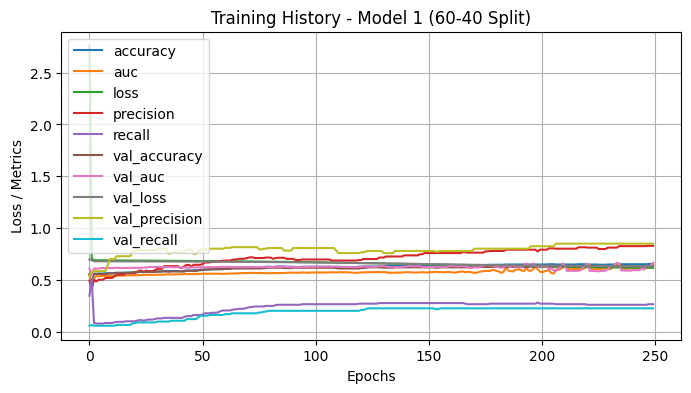

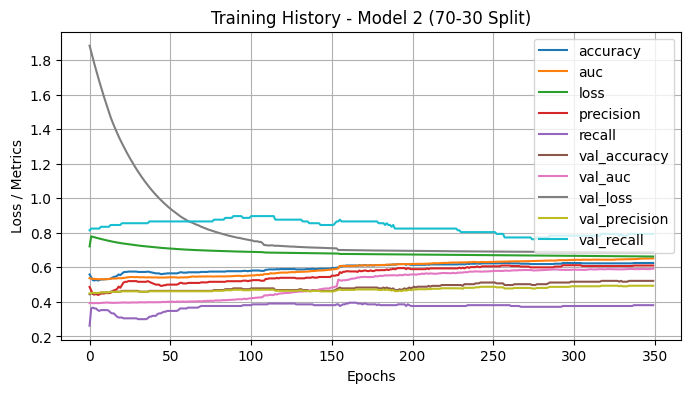

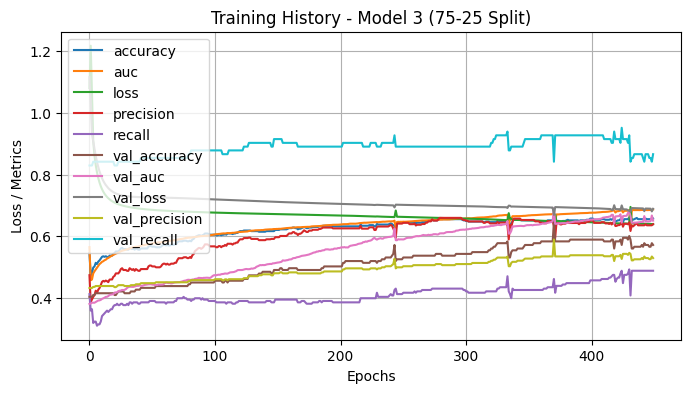

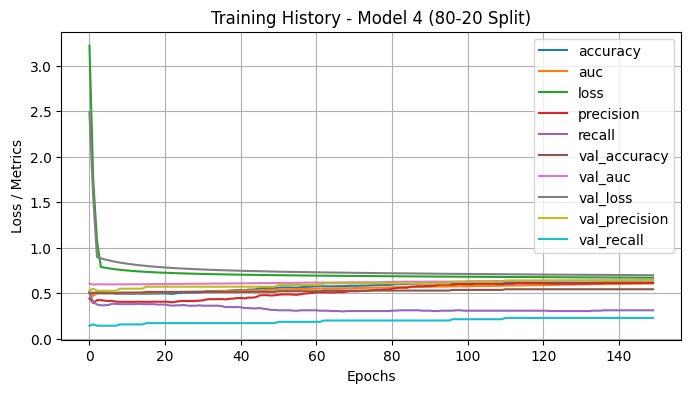

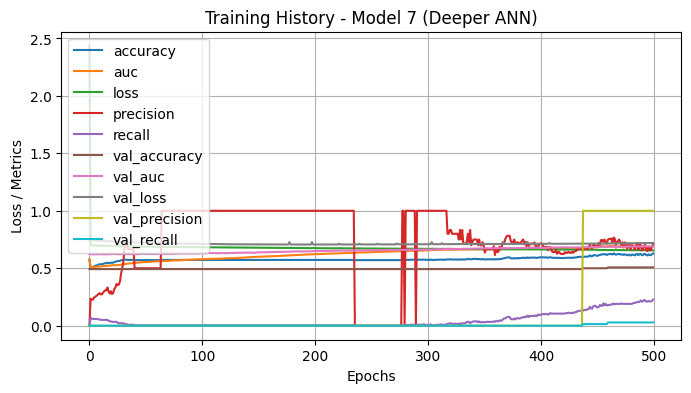

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Store histories in a dictionary
histories = {
    "Model 1 (60-40 Split)": history1,
    "Model 2 (70-30 Split)": history2,
    "Model 3 (75-25 Split)": history3,
    "Model 4 (80-20 Split)": history4,
    "Model 7 (Deeper ANN)": history7
}

# Plot for each model
for name, hist in histories.items():
    plt.figure(figsize=(8,4))
    pd.DataFrame(hist.history).plot(ax=plt.gca())
    plt.title(f"Training History - {name}")
    plt.ylabel("Loss / Metrics")
    plt.xlabel("Epochs")
    plt.grid(True)
    plt.show()
